**Importación de librerías que se van a utilizar**

In [1]:
#Librerías que se van a utilizar
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

**Conexión con archivos de Google Drive**

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [198]:
#Dado que los archivos contienen caracteres especiales, se utiliza encoding='latin1'
Top100 = pd.read_csv('/content/drive/MyDrive/Curso Data Science/Desafío 7/Dataset seleccionado/Top 100.csv',encoding='latin1')
Audio = pd.read_csv('/content/drive/MyDrive/Curso Data Science/Desafío 7/Dataset seleccionado/Audio.csv',encoding='latin1')

# **PROCESAMIENTO DE DATOS**

**Eliminación de las columnas que no serán de utilidad**

In [199]:
Top100 = Top100.drop(columns = ["url","Instance"])
Audio = Audio.drop(columns = ["spotify_track_id","spotify_track_preview_url","spotify_track_popularity","instrumentalness","liveness"])

**Creación de los nuevos dataframes, que poseen a la información mucho más ordenada**

## **Semana**

In [200]:
#Creación de un nuevo dataframe con las fechas
Semana = Top100.drop(columns = ["Week Position","Song","Performer","SongID","Previous Week Position","Peak Position","Weeks on Chart"])
#Eliminación de duplicados, manteniendo el dataframe
Semana.drop_duplicates(inplace = True)
#Verificación de que ya no existen los duplicados
Semana.sort_values(by = ["Day", "Month", "Year"]).head(10)
#Agregado de 0 adelante de los números de un dígito para evitar confusiones al concatenar la fecha
m = Semana.shape
#len es la cantidad de filas de Fecha
len = m[0]
#Creación de la fecha concatenada, primero una serie que sea la unión de las tres columnas
Concat = pd.to_datetime(dict(day=Semana.iloc[:,0],month=Semana.iloc[:,1],year = Semana.iloc[:,2]))
Semana.insert(3,"Fecha",Concat)
#Creación de la clave primaria para relacionar las tablas
#Primero se crea un panda series y después se agrega al dataframe
SID = np.arange(1,len+1)
#Antes de indexar el codigo tengo que tenerlo ordenado cronologicamente
#Orden cronológico
Semana.sort_values(by=["Fecha"], inplace = True)
Semana.insert(4,"Semana ID",SID)
#Se reemplaza el indica por la columna creada
Semana.set_index("Semana ID", inplace = True)
Semana.rename(columns = {"Day":"Día","Month":"Mes","Year":"Año"}, inplace = True)

In [201]:
Semana.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3279 entries, 1 to 3279
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Día     3279 non-null   int64         
 1   Mes     3279 non-null   int64         
 2   Año     3279 non-null   int64         
 3   Fecha   3279 non-null   datetime64[ns]
dtypes: datetime64[ns](1), int64(3)
memory usage: 128.1 KB


## **Top100**

In [202]:
#A top100 le agrego el campo de fecha concatenado, y lo ordeno igual que el de fecha
Concatfecha = pd.to_datetime(dict(day=Top100.iloc[:,7],month=Top100.iloc[:,8],year = Top100.iloc[:,9]))
Top100.insert(10,"Fecha",Concatfecha)
#Relación con la nueva tabla, que se llama Canción
Top100.drop(columns = ["Day", "Month", "Year"], inplace = True)
#Canciones = Top100.drop(columns = ["Week Position","Song","Performer","SongID","Previous Week Position","Peak Position","Weeks on Chart"])
Top100.sort_values(by = ["Fecha"], inplace = True)
#La columna fecha es la clave primaria que la relaciona con la otra tabla

In [203]:
Top100.rename(columns = {"Week Position":"Ranking","Song":"Canción","Performer":"Artista","SongID":"Canción ID","Previous Week Position":"Ranking semana anterior","Peak Position":"Máximo Ranking","Weeks on Chart":"Semanas en Hot100" }, inplace = True)

In [204]:
Top100.insert(8,"Artista ID",0)

## **Artista**

In [205]:
#La duración está almacenada en milisegundos
Artista = Top100.drop(columns = ["Ranking", "Canción", "Canción ID", "Ranking semana anterior", "Máximo Ranking", "Semanas en Hot100", "Fecha"])
Artista.drop_duplicates(inplace = True)
Artista.sort_values(by = ["Artista"], inplace = True)
a = Artista.shape
#lon es la cantidad de filas de artista
lon = a[0]
AID = np.arange(1,lon+1)
Artista.iloc[:,1]=AID
#Se reemplaza el indice por la columna creada
#Artista.set_index("Artista ID", inplace = True)

## **Canción**

In [206]:
Canción = Audio.rename(columns = {"SongID":"Canción ID","spotify_genre":"Género","spotify_track_duration_ms":"Duración","spotify_track_explicit":"Explícita","spotify_track_album":"Álbum","mode":"Modo","key":"Llave","danceability":"Bailabilidad","energy":"Energía","tempo":"Tempo","valence":"Valencia","acousticness":"acusticidad","speechiness":"contenido vocal"})

In [207]:
Canción.drop_duplicates(inplace = True)
Canción.sort_values(by=["Canción ID"], inplace = True)

In [208]:
Canción

,Canción ID,Género,Duración,Explícita,Álbum,Bailabilidad,Energía,Llave,loudness,Modo,contenido vocal,acusticidad,Valencia,Tempo
17,"""B"" GirlsYoung And Restless",[],242106.0,FALSO,Something To Get You Hyped,0.615,0.497,7.0,-11.913,1.0,0.4390,0.0160,0.769,193.762
18,"""Cherry Cherry"" from Hot August NightNeil Diamond","['adult standards', 'brill building pop', 'fol...",443320.0,FALSO,Hot August Night / NYC (Live From Madison Squa...,0.340,0.948,9.0,-5.061,1.0,0.1370,0.0941,0.604,172.349
19,"""Having A Party"" MedleyThe Ovations (Featuring...","['memphis soul', 'southern soul']",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20,"""Joy"" Pt. IIsaac Hayes","['classic soul', 'disco', 'funk', 'jazz funk',...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
21,"""Roots"" MedleyQuincy Jones","['adult standards', 'disco', 'funk', 'jazz fun...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25201,the.climb.backJ. Cole,"['conscious hip hop', 'north carolina hip hop'...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
28107,whoa (mind in awe)XXXTENTACION,"['emo rap', 'miami hip hop']",157776.0,FALSO,SKINS,0.735,0.525,6.0,-2.939,0.0,0.0441,0.6530,0.369,160.147
28112,whoknowsMusiq,"['alternative r&b', 'dance pop', 'neo soul', '...",295320.0,FALSO,soulstar,0.419,0.694,2.0,-6.144,1.0,0.1220,0.2300,0.316,118.862
28622,www.memoryAlan Jackson,"['contemporary country', 'country', 'country r...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## **Género**

In [209]:
Género = Canción.drop(columns = ["Duración", "Explícita", "Álbum", "Bailabilidad", "Energía", "Llave", "loudness", 
                                 "Modo", "contenido vocal", "acusticidad", "Valencia", "Tempo"])
G = pd.Series(Género.iloc[:,1])
Pop = G.str.contains("pop", case = False)
Rock = G.str.contains("rock|rock-and-roll", case = False)
Clásica = G.str.contains("classical", case = False)
Jazz = G.str.contains("jazz", case = False)
Blues = G.str.contains("blues", case = False)
Hiphop = G.str.contains("hip hop|hip-hop", case = False)
Rap = G.str.contains("rap", case = False)
Trap = G.str.contains("trap", case = False)
Electrónica = G.str.contains("electronic|electronica|techno", case = False)
Country = G.str.contains("country", case = False)
Soul = G.str.contains("soul", case = False)
Funk = G.str.contains("funk", case = False)
Disco = G.str.contains("disco", case = False)
Reggae = G.str.contains("reggae", case = False)
Reggaetón = G.str.contains("reggaeton", case = False)
Gospel = G.str.contains("gospel", case = False)
Metal = G.str.contains("metal", case = False)
RyB = G.str.contains("R&B", case = False)
Bachata = G.str.contains("bachata", case = False)
BossaNova = G.str.contains("bossa nova", case = False)

In [210]:
#Se agregan todas las series al dataframe
Género.insert(2, "Pop", Pop) 
Género.insert(3, "Rock", Rock) 
Género.insert(4, "Música Clásica", Clásica) 
Género.insert(5, "Jazz", Jazz) 
Género.insert(6, "Blues", Blues) 
Género.insert(7, "Hiphop", Hiphop) 
Género.insert(8, "Rap", Rap) 
Género.insert(9, "Trap", Trap) 
Género.insert(10, "Electrónica", Electrónica) 
Género.insert(11, "Country", Country) 
Género.insert(12, "Soul", Soul) 
Género.insert(13, "Funk", Funk) 
Género.insert(14, "Disco", Disco) 
Género.insert(15, "Reggae", Reggae) 
Género.insert(16, "Reggaetón", Reggaetón) 
Género.insert(17, "Gospel", Gospel) 
Género.insert(18, "Metal", Metal) 
Género.insert(19, "R&B", RyB) 
Género.insert(20, "Bachata", Bachata)
Género.insert(21, "Bossa Nova", BossaNova)
Género.insert(22, "Desconocido", 0) 

In [211]:
registros = Género.shape[0]
for i in range(0,registros):
  if ((Género.iloc[i,2] == False) and (Género.iloc[i,3] == False) and (Género.iloc[i,4] == False) and (Género.iloc[i,5] == False) and (Género.iloc[i,6] == False) and (Género.iloc[i,7] == False) and (Género.iloc[i,8] == False) and (Género.iloc[i,9] == False) and (Género.iloc[i,10] == False) and (Género.iloc[i,11] == False) and (Género.iloc[i,12] == False) and (Género.iloc[i,13] == False) and (Género.iloc[i,14] == False) and (Género.iloc[i,15] == False) and (Género.iloc[i,16] == False) and (Género.iloc[i,17] == False) and (Género.iloc[i,18] == False) and (Género.iloc[i,19] == False) and (Género.iloc[i,20] == False) and (Género.iloc[i,21] == False)):
    Género.iloc[i,22] = True

In [212]:
#Se elimina del dataframe canción la columna de género
Canción.drop(columns = "Género", inplace = True)
Género.drop(columns = "Género", inplace = True)

In [213]:
Género

,Canción ID,Pop,Rock,Música Clásica,Jazz,Blues,Hiphop,Rap,Trap,Electrónica,...,Funk,Disco,Reggae,Reggaetón,Gospel,Metal,R&B,Bachata,Bossa Nova,Desconocido
17,"""B"" GirlsYoung And Restless",False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
18,"""Cherry Cherry"" from Hot August NightNeil Diamond",True,True,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,0
19,"""Having A Party"" MedleyThe Ovations (Featuring...",False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,0
20,"""Joy"" Pt. IIsaac Hayes",False,False,False,True,False,False,False,False,False,...,True,True,False,False,False,False,False,False,False,0
21,"""Roots"" MedleyQuincy Jones",False,False,False,True,False,False,False,False,False,...,True,True,False,False,False,False,False,False,False,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25201,the.climb.backJ. Cole,False,False,False,False,False,True,True,False,False,...,False,False,False,False,False,False,False,False,False,0
28107,whoa (mind in awe)XXXTENTACION,False,False,False,False,False,True,True,False,False,...,False,False,False,False,False,False,False,False,False,0
28112,whoknowsMusiq,True,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,True,False,False,0
28622,www.memoryAlan Jackson,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,0


**Exportación de los nuevos dataframes a un archivo csv, para evitar tener que volver a correr todo de nuevo**

In [214]:
#Exportar a excel: .to_excel. En Excel se agregan las claves primarias que hacen falta en los dataframes. Se decidió hacer de esta manera 
#porque en  python tardaba mucho 
Top100.to_excel(r"Downloads\Top100.xlsx")
Canción.to_excel(r"Downloads\Canción.xlsx")
Artista.to_excel(r"Downloads\Artista.xlsx")
Semana.to_excel(r"Downloads\Fecha.xlsx")
Género.to_excel(r"Downloads\Género.xlsx")

# **LIMPIEZA DE DATOS**

**Se importan los archivos csv con los dataframes ordenados**

In [215]:
#importación de los archivos excel, verificar que queden bien los índices. 
#Artista y semana no se modificaron, solo se vuelven a importar canción y top100
Top100 = pd.read_excel("/content/drive/MyDrive/Curso Data Science/Desafío 7/Dataset seleccionado/Top100.xlsx")

In [216]:
Canción = pd.read_excel("/content/drive/MyDrive/Curso Data Science/Desafío 7/Dataset seleccionado/Canción.xlsx")

## **Datos ausentes**

### **Semana**

In [217]:
Semana.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3279 entries, 1 to 3279
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Día     3279 non-null   int64         
 1   Mes     3279 non-null   int64         
 2   Año     3279 non-null   int64         
 3   Fecha   3279 non-null   datetime64[ns]
dtypes: datetime64[ns](1), int64(3)
memory usage: 128.1 KB


### **Top100**

In [218]:
#Hay una columna extra, que era el índice del dataframe, se elimina
#También se elimina la columna artista, que es redundante porque ya se tiene su Artista ID
Top100.drop(columns = ["Unnamed: 0"], inplace = True)

In [219]:
Top100.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 327895 entries, 0 to 327894
Data columns (total 7 columns):
 #   Column                   Non-Null Count   Dtype         
---  ------                   --------------   -----         
 0   Ranking                  327895 non-null  int64         
 1   Canción ID               327895 non-null  object        
 2   Ranking semana anterior  295941 non-null  float64       
 3   Máximo Ranking           327895 non-null  int64         
 4   Semanas en Hot100        327895 non-null  int64         
 5   Fecha                    327895 non-null  datetime64[ns]
 6   Artista ID               327895 non-null  int64         
dtypes: datetime64[ns](1), float64(1), int64(4), object(1)
memory usage: 17.5+ MB


In [220]:
for i in range(0,100):
  Top100.iloc[i,2] = 0
Nulos = Top100.isna()
for i in range(100,327895):
  if (Nulos.iloc[i,2] == True and Top100.iloc[i,4] == 1):
    Top100.iloc[i,2] = 0
  if (Nulos.iloc[i,2] == True and Top100.iloc[i,4] != 1):
    Top100.iloc[i,2] = 101

In [221]:
Top100

,Ranking,Canción ID,Ranking semana anterior,Máximo Ranking,Semanas en Hot100,Fecha,Artista ID
0,31,Chantilly LaceBig Bopper,0.0,31,1,1958-08-02,781
1,82,Blip BlopBill Doggett,0.0,82,1,1958-08-02,833
2,99,I'll Get By (As Long As I Have You)Billy Williams,0.0,99,1,1958-08-02,897
3,3,Splish SplashBobby Darin,0.0,3,1,1958-08-02,1022
4,35,Rock-in RobinBobby Day,0.0,35,1,1958-08-02,1023
...,...,...,...,...,...,...,...
327890,65,GoosebumpsTravis Scott & HVME,47.0,47,18,2021-05-29,9459
327891,50,Miss The RageTrippie Redd & Playboi Carti,11.0,11,2,2021-05-29,9498
327892,63,SkiYoung Thug & Gunna,51.0,18,5,2021-05-29,9951
327893,76,SolidYoung Thug & Gunna Featuring Drake,57.0,12,5,2021-05-29,9952


In [222]:
Top100["Canción ID"] = Top100["Canción ID"].astype("string")

### **Artista**

In [223]:
Artista["Artista"] = Artista["Artista"].astype("string")

In [224]:
Artista.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10061 entries, 284 to 322636
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Artista     10061 non-null  string
 1   Artista ID  10061 non-null  int64 
dtypes: int64(1), string(1)
memory usage: 235.8 KB


### **Canción**

In [225]:
Canción["Álbum"] = Canción["Álbum"].astype("string")
Canción["Explícita"] = Canción["Explícita"].astype("string")
Canción["Canción ID"] = Canción["Canción ID"].astype("string")
Canción["Nombre"] = Canción["Nombre"].astype("string")

In [226]:
Canción.drop(columns = ["Unnamed: 0"], inplace = True)

In [227]:
Canción.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29396 entries, 0 to 29395
Data columns (total 15 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Canción ID       29396 non-null  string 
 1   Duración         24298 non-null  float64
 2   Explícita        24298 non-null  string 
 3   Álbum            24292 non-null  string 
 4   Bailabilidad     24235 non-null  float64
 5   Energía          24235 non-null  float64
 6   Clave            24235 non-null  float64
 7   Sonoridad        24235 non-null  float64
 8   Modo             24235 non-null  float64
 9   Contenido vocal  24235 non-null  float64
 10  Acusticidad      24235 non-null  float64
 11  Valencia         24235 non-null  float64
 12  Tempo            24235 non-null  float64
 13  Nombre           29393 non-null  string 
 14  Artista ID       29395 non-null  float64
dtypes: float64(11), string(4)
memory usage: 3.4 MB


In [228]:
Canción["Álbum"] = Canción["Álbum"].fillna("Desconocido")
Canción["Explícita"] = Canción["Explícita"].fillna("Desconocido")
#Canción["Modo"] = Canción["Modo"].fillna("2") # 2 indica que es desconocido 
#Canción["Clave"] = Canción["Clave"].fillna("12") # 12 indica que es desconocido 

In [229]:
#Canción["Clave"] = Canción["Clave"].astype("int64") 
#Canción["Modo"]=Canción["Modo"].astype("int64") 

### **Género**

In [230]:
Vacíos = Género.isna()
#Barre por filas de la matriz género
for i in range(0,Género.shape[0]):
  #Barre por columna, tengo que completar todo el dataframe (no incluye al 21)
  for j in range(1,21):
    if (Vacíos.iloc[i,j] == True):
      Género.iloc[i,j] = False

In [231]:
for i in range(0,Género.shape[0]):
  if Género.iloc[i,21] == 0:
    Género.iloc[i,21] = False

In [232]:
Género["Canción ID"] = Género["Canción ID"].astype("string")
Género["Pop"] = Género["Pop"].astype("boolean")
Género["Rock"] = Género["Rock"].astype("boolean")
Género["Música Clásica"] = Género["Música Clásica"].astype("boolean")
Género["Jazz"] = Género["Jazz"].astype("boolean")
Género["Blues"] = Género["Blues"].astype("boolean")
Género["Hiphop"] = Género["Hiphop"].astype("boolean")
Género["Rap"] = Género["Rap"].astype("boolean")
Género["Trap"] = Género["Trap"].astype("boolean")
Género["Electrónica"] = Género["Electrónica"].astype("boolean")
Género["Country"] = Género["Country"].astype("boolean")
Género["Soul"] = Género["Soul"].astype("boolean")
Género["Funk"] = Género["Funk"].astype("boolean")
Género["Disco"] = Género["Disco"].astype("boolean")
Género["Reggae"] = Género["Reggae"].astype("boolean")
Género["Reggaetón"] = Género["Reggaetón"].astype("boolean")
Género["Gospel"] = Género["Gospel"].astype("boolean")
Género["Metal"] = Género["Metal"].astype("boolean")
Género["R&B"] = Género["R&B"].astype("boolean")
Género["Bachata"] = Género["Bachata"].astype("boolean")
Género["Bossa Nova"] = Género["Bossa Nova"].astype("boolean")
Género["Desconocido"] = Género["Desconocido"].astype("boolean")

In [233]:
Género["Desconocido"].unique()


<BooleanArray>
[True, False]
Length: 2, dtype: boolean

## **Valores atípicos**

**Semana**

[Text(0.5, 1.0, 'Días'),
 Text(0.5, 0, 'Día'),
 Text(0, 0.5, 'Cantidad de apariciones')]

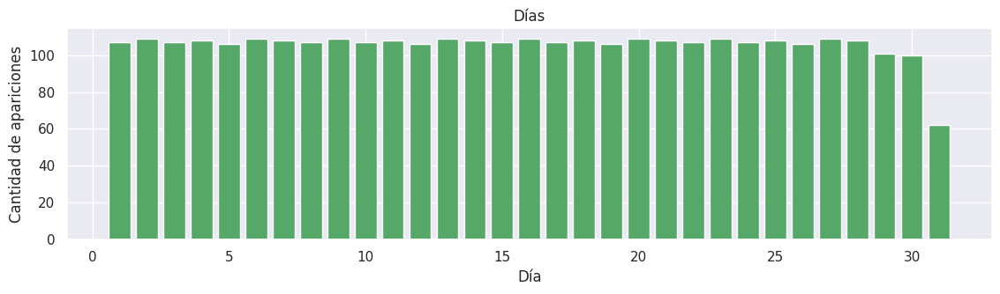

In [234]:
#array con los valores de los días
y = Semana["Día"].sort_values().value_counts()
fig, ax = plt.subplots()
ax.bar(y.index, y.values, color = "g")
ax.set(title = "Días",
       xlabel = "Día",
       ylabel = "Cantidad de apariciones")

[Text(0.5, 1.0, 'Meses'),
 Text(0.5, 0, 'Mes'),
 Text(0, 0.5, 'Cantidad de apariciones')]

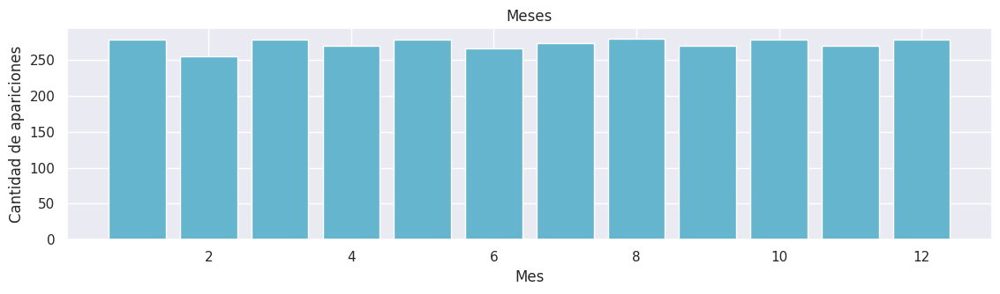

In [235]:
#array con los valores de los días
y = Semana["Mes"].sort_values().value_counts()
fig, ax = plt.subplots()
ax.bar(y.index, y.values, color = "c")
ax.set(title = "Meses",
       xlabel = "Mes",
       ylabel = "Cantidad de apariciones")

[Text(0.5, 1.0, 'Años'),
 Text(0.5, 0, 'Año'),
 Text(0, 0.5, 'Cantidad de apariciones')]

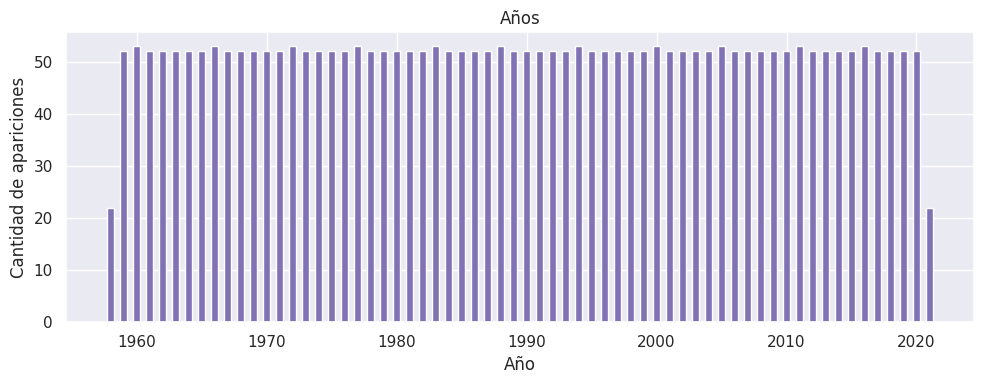

In [236]:
#array con los valores de los días
y = Semana["Año"].sort_values().value_counts()
fig, ax = plt.subplots(figsize=(10,4))
ax.bar(y.index, y.values, color = "m", width=0.5)
ax.set(title = "Años",
       xlabel = "Año",
       ylabel = "Cantidad de apariciones")

**Top100**

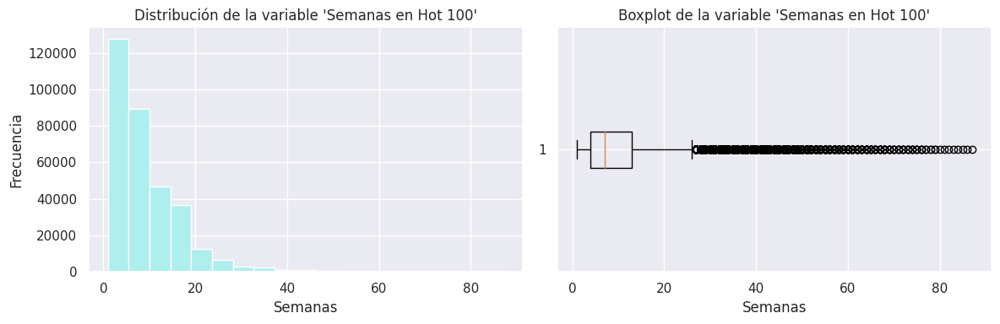

In [237]:
#Análisis de la variable cuantitativa "Semanas en Hot 100"
#for col in ["acidez fija", "acidez volatil"]:
fig, ax = plt.subplots(1,2, figsize = (12,4))
ax[0].hist(Top100.iloc[:,4], bins=19, color = "paleturquoise")
ax[0].set(title = "Distribución de la variable 'Semanas en Hot 100'",
       xlabel = "Semanas",
       ylabel = "Frecuencia")
x = Top100.iloc[:,4]
#Análisis de la variable duración
ax[1].boxplot(x.values, vert = False)
ax[1].set(title = "Boxplot de la variable 'Semanas en Hot 100'",
       xlabel = "Semanas")
plt.show()

In [238]:
#Semanas en Hot100
Top100["Semanas en Hot100"].sort_values()
media = Top100["Semanas en Hot100"].mean()
moda = Top100["Semanas en Hot100"].mode()
mediana = Top100["Semanas en Hot100"].median()
skw = Top100["Semanas en Hot100"].skew()
print(skw)

1.819319070836878


[Text(0.5, 1.0, "Distribución de la variable 'Ranking'"),
 Text(0.5, 0, 'Posición'),
 Text(0, 0.5, 'Frecuencia')]

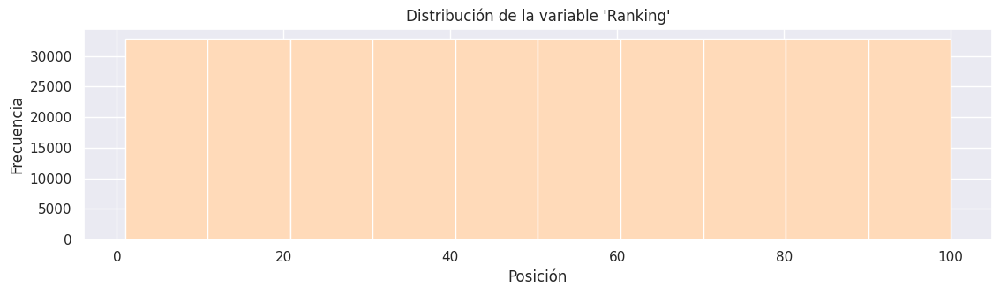

In [239]:
#Ranking
fig, ax = plt.subplots()
ax.hist(Top100.iloc[:,0], color = "peachpuff")
ax.set(title = "Distribución de la variable 'Ranking'",
       xlabel = "Posición",
       ylabel = "Frecuencia")

[Text(0.5, 1.0, "Distribución de la variable 'Ranking semana anterior'"),
 Text(0.5, 0, 'Posición'),
 Text(0, 0.5, 'Frecuencia')]

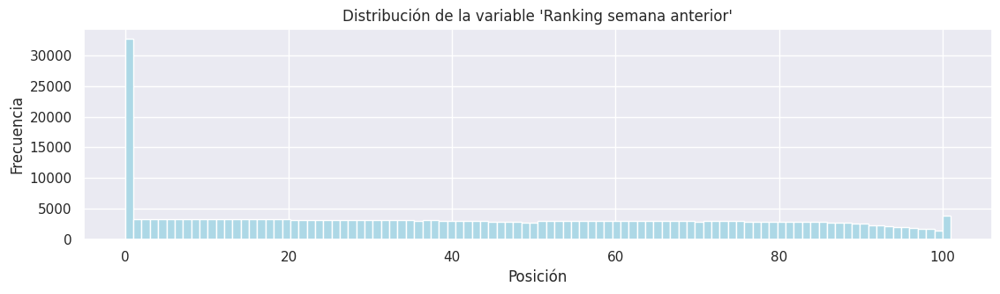

In [240]:
#Ranking semana anterior
fig, ax = plt.subplots()
ax.hist(Top100.iloc[:,2], bins = 100, color = "lightblue")
ax.set(title = "Distribución de la variable 'Ranking semana anterior'",
       xlabel = "Posición",
       ylabel = "Frecuencia")

[Text(0.5, 1.0, "Distribución de la variable 'Máximo ranking'"),
 Text(0.5, 0, 'Posición'),
 Text(0, 0.5, 'Frecuencia')]

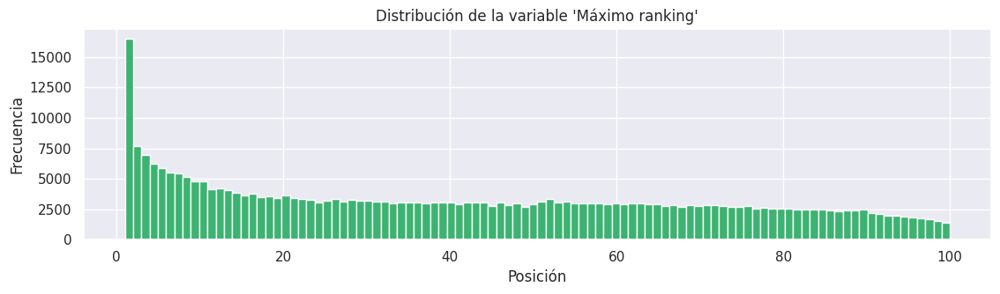

In [241]:
#Máximo ranking
fig, ax = plt.subplots()
ax.hist(Top100.iloc[:,3], bins = 100, color = "mediumseagreen")
ax.set(title = "Distribución de la variable 'Máximo ranking'",
       xlabel = "Posición",
       ylabel = "Frecuencia")

### **Canción**

**Columna duración**

In [242]:
#La duración está en milisegundos, la paso a segundos
Canción["Duración"] = (Canción["Duración"]/1000)

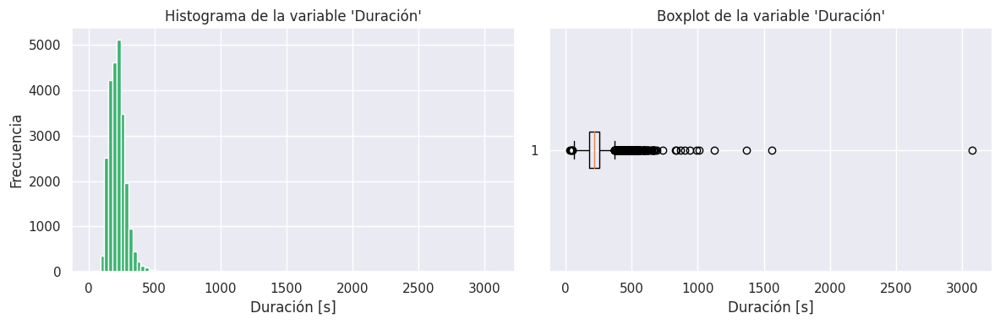

In [243]:
#Análisis de la variable duración
fig, ax = plt.subplots(1,2, figsize = (12,4))
ax[0].hist(Canción["Duración"], bins = 100, color = "mediumseagreen")
ax[0].set(title = "Histograma de la variable 'Duración'",
       xlabel = "Duración [s]",
       ylabel = "Frecuencia")
#Análisis de la variable duración
x = Canción["Duración"]
x.dropna(inplace = True) #Se eliminan los registros vaciós
ax[1].boxplot(x.values, vert = False)
ax[1].set(title = "Boxplot de la variable 'Duración'",
       xlabel = "Duración [s]")
plt.show()

In [244]:
#En estas condiciones
media = Canción["Duración"].mean()
moda = Canción["Duración"].mode()
mediana = Canción["Duración"].median()
Q1 = Canción["Duración"].quantile(0.25)
Q3 = Canción["Duración"].quantile(0.75)
Inliersup = Q3 + 1.5*(Q3-Q1)
Inlierinf = Q1 - 1.5*(Q3-Q1)
print(media, mediana)

220.78526454852252 215.0


In [245]:
#Se reemplazan los valores atípicos por np.nan
for i in range(1,29396):
  if Canción.iloc[i,1] > Inliersup or Canción.iloc[i,1] < Inlierinf :
    Canción.iloc[i,1] = np.nan
#Se reemplazan los nan por la media
Canción["Duración"].fillna(media,inplace=True)

**Columnas Valencia, Energía, Acusticidad, Contenido Vocal y Bailabilidad**

[Text(0.5, 1.0, 'Acusticidad'), Text(0, 0.5, 'Frecuencia')]

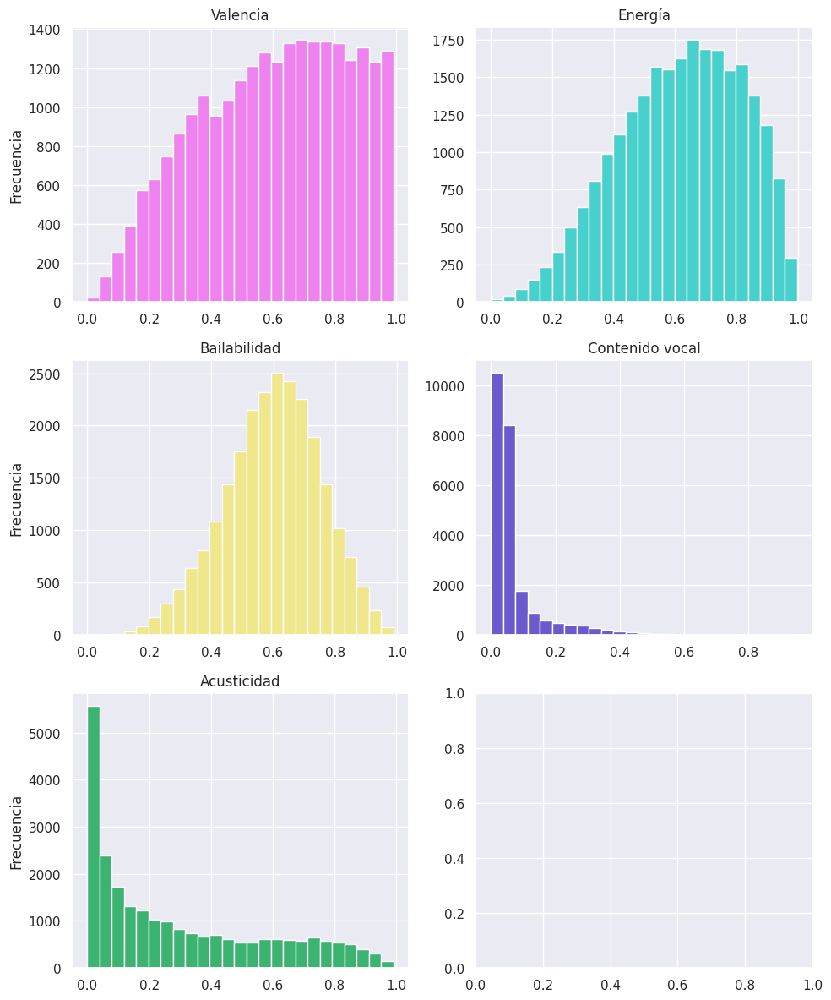

In [246]:
#Histogramas
fig, ax = plt.subplots(3,2, figsize = (10,12))
ax[0,0].hist(Canción["Valencia"], bins = 25, color = "violet")
ax[0,0].set(title = "Valencia",
       ylabel = "Frecuencia")
ax[0,1].hist(Canción["Energía"], bins = 25, color = "mediumturquoise")
ax[0,1].set(title = "Energía")
ax[1,0].hist(Canción["Bailabilidad"], bins = 25, color = "khaki")
ax[1,0].set(title = "Bailabilidad",
       ylabel = "Frecuencia")
ax[1,1].hist(Canción["Contenido vocal"], bins = 25, color = "slateblue")
ax[1,1].set(title = "Contenido vocal")
ax[2,0].hist(Canción["Acusticidad"], bins = 25, color = "mediumseagreen")
ax[2,0].set(title = "Acusticidad",
       ylabel = "Frecuencia")

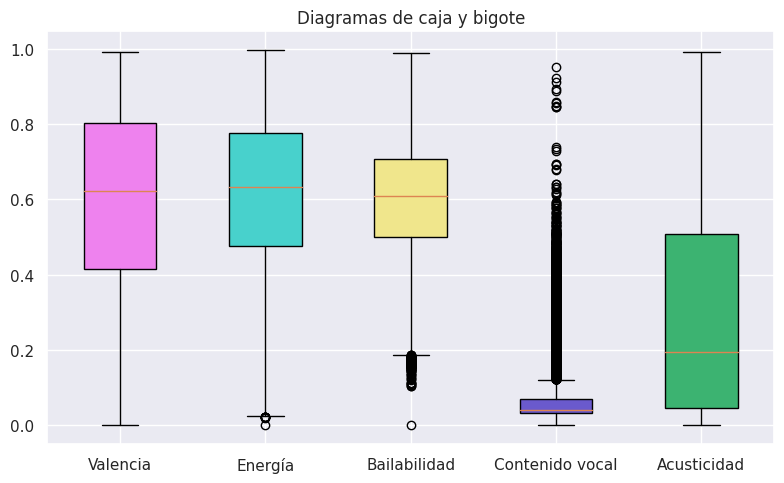

In [247]:
#Diagramas de caja y bigote
x = Canción["Bailabilidad"].dropna()  #Bailabilidad
y = Canción["Energía"].dropna()  #Energía
z = Canción["Contenido vocal"].dropna() #Contenido vocal
w = Canción["Acusticidad"].dropna() #Acusticidad
v = Canción["Valencia"].dropna() #Valencia
dfplot = pd.concat([v,y,x,z,w], axis = 1)
fig, ax = plt.subplots(figsize = (8,5))
bplot = ax.boxplot(dfplot, labels = ["Valencia","Energía","Bailabilidad","Contenido vocal","Acusticidad"],patch_artist=True)
ax.set(title = "Diagramas de caja y bigote")
#Relleno con colores
colors = ["violet","mediumturquoise","khaki","slateblue","mediumseagreen"]
for patch, color in zip(bplot['boxes'], colors):
        patch.set_facecolor(color)

In [248]:
#Reemplazo de valores ausentes y atípicos
#Valencia, no tiene valores atípicos, solo se reemplazan los nan por la media
mediavalencia = v.mean()
Canción["Valencia"].fillna(mediavalencia,inplace=True)
#Acusticidad, no tiene valores atípicos, solo se reemplazan los nan por la media
mediaacus = w.mean()
Canción["Acusticidad"].fillna(mediaacus,inplace=True)
#Energía, tiene algunos valores atípicos, se reemplazan por np.nan
mediaener = y.mean()
Q1 = y.quantile(0.25)
Q3 = y.quantile(0.75)
Inliersup = Q3 + 1.5*(Q3-Q1)
Inlierinf = Q1 - 1.5*(Q3-Q1)
for i in range(1,29396):
  if Canción.iloc[i,5] > Inliersup or Canción.iloc[i,5] < Inlierinf :
    Canción.iloc[i,5] = np.nan
#Se reemplazan los nan por la media
Canción["Energía"].fillna(mediaener,inplace=True)
#Bailabilidad, tiene algunos valores atípicos, se reemplazan por np.nan
mediabaila = x.mean()
Q1 = x.quantile(0.25)
Q3 = x.quantile(0.75)
Inliersup = Q3 + 1.5*(Q3-Q1)
Inlierinf = Q1 - 1.5*(Q3-Q1)
for i in range(1,29396):
  if Canción.iloc[i,4] > Inliersup or Canción.iloc[i,4] < Inlierinf :
    Canción.iloc[i,4] = np.nan
#Se reemplazan los nan por la media
Canción["Bailabilidad"].fillna(mediabaila,inplace=True)
#Contenido vocal, no se consideran outliers
mediacontvoc = z.mean()
Canción["Contenido vocal"].fillna(mediacontvoc,inplace=True)

In [249]:
Canción.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29396 entries, 0 to 29395
Data columns (total 15 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Canción ID       29396 non-null  string 
 1   Duración         29396 non-null  float64
 2   Explícita        29396 non-null  string 
 3   Álbum            29396 non-null  string 
 4   Bailabilidad     29396 non-null  float64
 5   Energía          29396 non-null  float64
 6   Clave            24235 non-null  float64
 7   Sonoridad        24235 non-null  float64
 8   Modo             24235 non-null  float64
 9   Contenido vocal  29396 non-null  float64
 10  Acusticidad      29396 non-null  float64
 11  Valencia         29396 non-null  float64
 12  Tempo            24235 non-null  float64
 13  Nombre           29393 non-null  string 
 14  Artista ID       29395 non-null  float64
dtypes: float64(11), string(4)
memory usage: 3.4 MB


**Tempo**

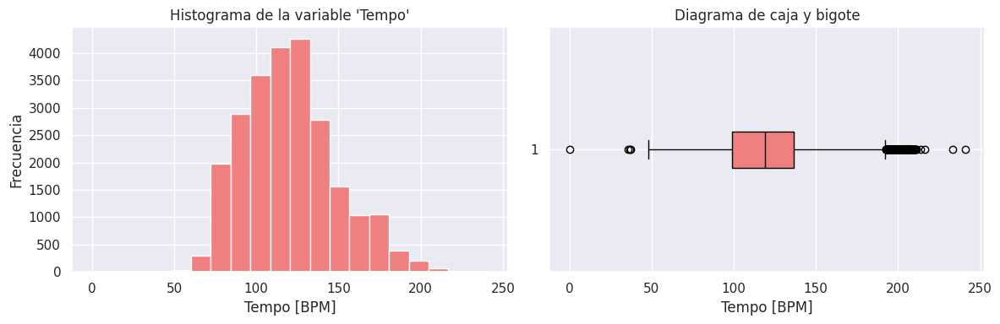

In [250]:
#Histograma
fig, ax = plt.subplots(1,2, figsize = (12,4))
ax[0].hist(Canción["Tempo"], bins = 20, color = "lightcoral")
ax[0].set(title = "Histograma de la variable 'Tempo'",
       xlabel = "Tempo [BPM]",
       ylabel = "Frecuencia")
x = Canción["Tempo"].dropna()
medianprops = dict(color="black",linewidth=1)
bplot = ax[1].boxplot(x, medianprops = medianprops, patch_artist=True, vert = False)
ax[1].set(title = "Diagrama de caja y bigote",
          xlabel = "Tempo [BPM]")
#Relleno con colores
colors = ["lightcoral"]
for patch, color in zip(bplot['boxes'], colors):
        patch.set_facecolor(color)

In [251]:
#Reemplazo de valores ausentes y atípicos de Tempo
mediatempo = Canción["Tempo"].mean()
Q1 = Canción["Tempo"].quantile(0.25)
Q3 = Canción["Tempo"].quantile(0.75)
Inliersup = Q3 + 1.5*(Q3-Q1)
Inlierinf = Q1 - 1.5*(Q3-Q1)
for i in range(1,29396):
  if Canción.iloc[i,12] > Inliersup or Canción.iloc[i,12] < Inlierinf :
    Canción.iloc[i,12] = np.nan
#Reemplazo de los NaN por la media
Canción["Tempo"].fillna(mediatempo,inplace=True)

**Sonoridad**

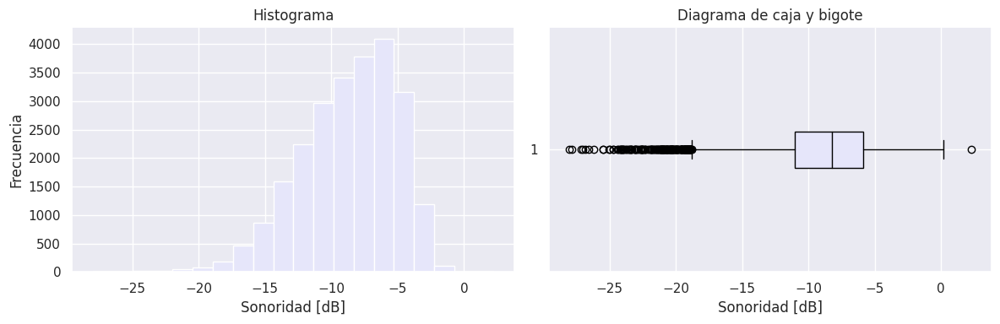

In [252]:
#Histograma
fig, ax = plt.subplots(1,2, figsize = (12,4))
ax[0].hist(Canción["Sonoridad"], bins = 20, color = "lavender")
ax[0].set(title = "Histograma",
       xlabel = "Sonoridad [dB]",
       ylabel = "Frecuencia")
#Boxplot
x = Canción["Sonoridad"].dropna()
medianprops = dict(color="black",linewidth=1)
bplot = ax[1].boxplot(x, medianprops = medianprops, patch_artist=True, vert = False)
ax[1].set(title = "Diagrama de caja y bigote",
          xlabel = "Sonoridad [dB]")
#Relleno con colores
colors = ["lavender"]
for patch, color in zip(bplot['boxes'], colors):
        patch.set_facecolor(color)

In [253]:
#Reemplazo de valores ausentes y atípicos de Sonoridad
mediasono = Canción["Sonoridad"].mean()
Q1 = Canción["Sonoridad"].quantile(0.25)
Q3 = Canción["Sonoridad"].quantile(0.75)
Inliersup = Q3 + 1.5*(Q3-Q1)
Inlierinf = Q1 - 1.5*(Q3-Q1)
for i in range(1,29396):
  if Canción.iloc[i,7] > Inliersup or Canción.iloc[i,7] < Inlierinf :
    Canción.iloc[i,7] = np.nan
#Reemplazo de los NaN por la media
Canción["Sonoridad"].fillna(mediasono,inplace=True)

**Campos Clave y Modo**

[Text(0.5, 1.0, 'Variable Clave'), Text(0.5, 0, 'Clave')]

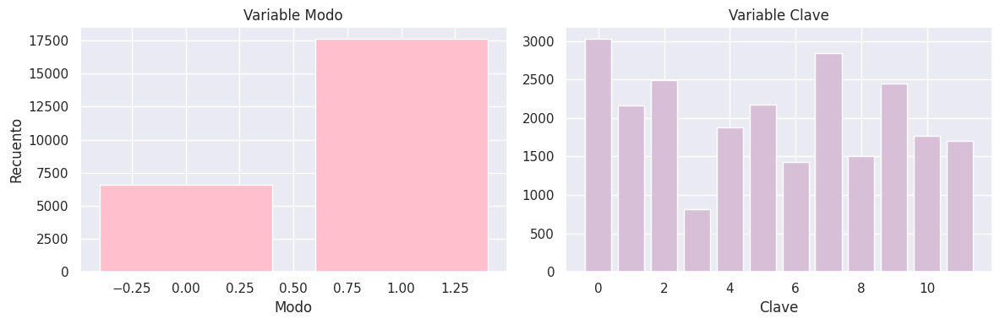

In [254]:
#Modo
fig, ax = plt.subplots(1,2, figsize = (12,4))
y1 = Canción["Modo"].value_counts()
ax[0].bar(y1.index, y1.values, color = "pink")
ax[0].set(title = "Variable Modo",
       xlabel = "Modo",
       ylabel = "Recuento")
#Clave
y2 = Canción["Clave"].value_counts()
ax[1].bar(y2.index, y2.values, color = "thistle")
ax[1].set(title = "Variable Clave",
       xlabel = "Clave")

**Correlación entre variables**

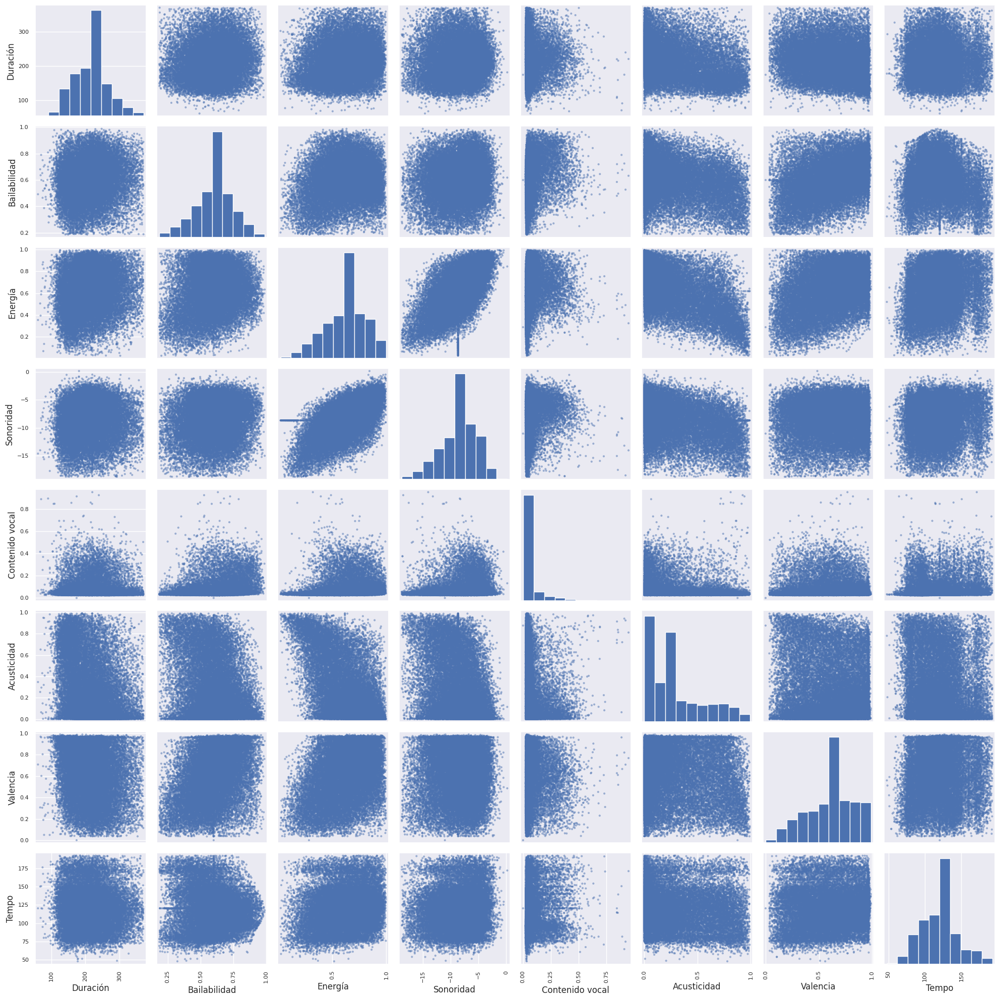

In [255]:
#Sonoridad, tempo, bailabilidad, duración, valencia, acusticidad, contenido vocal, energía
dataf = Canción.drop(columns = ["Canción ID", "Artista ID", "Explícita","Álbum", "Modo","Clave", "Nombre"])
pd.plotting.scatter_matrix(dataf, figsize=(20,20))
plt.savefig("Correlaciones.jpg")

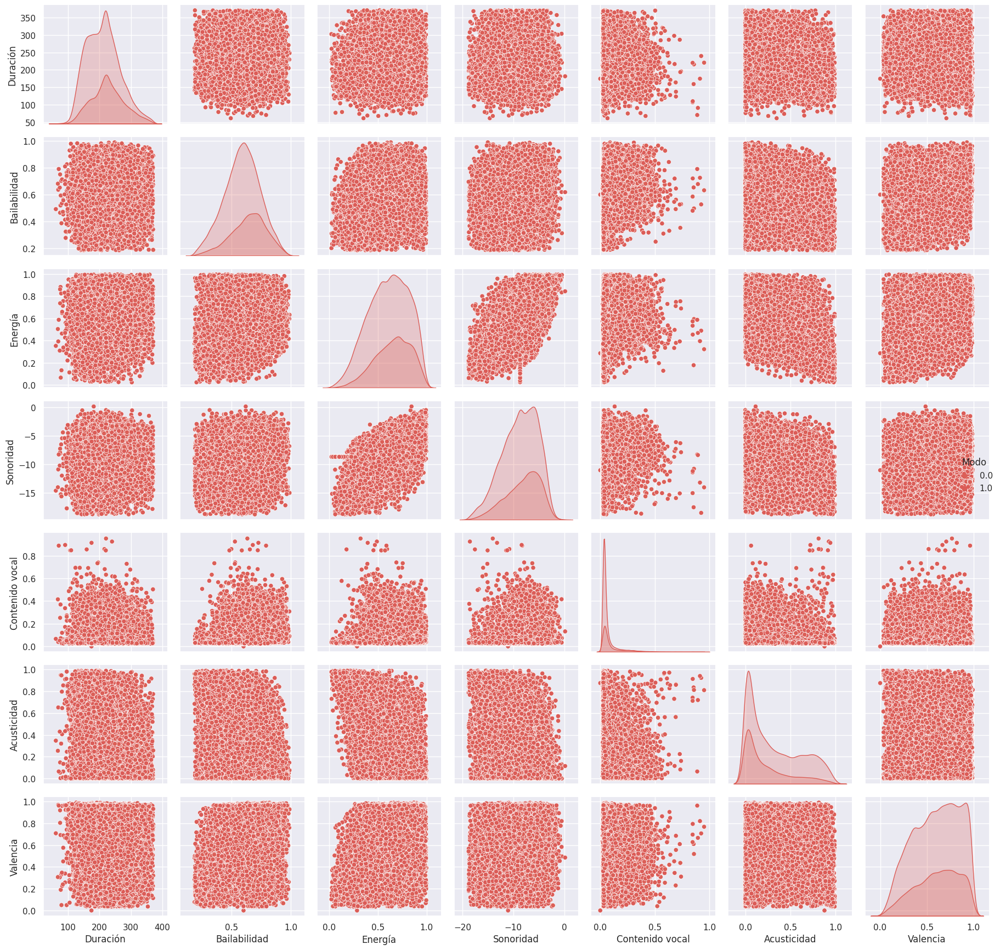

In [256]:
dataf = Canción.drop(columns = ["Canción ID", "Artista ID", "Explícita","Álbum", "Clave", "Nombre"])
sns.set(color_codes = True)
sns.color_palette("viridis")
sns.pairplot(dataf, vars = ["Duración", "Bailabilidad", "Energía","Sonoridad","Contenido vocal","Acusticidad","Valencia"], hue = "Modo", palette = "hls")
plt.savefig("output.png")

# **ANÁLISIS DE DATOS**

### **Indicadores generales**

In [ ]:
#Cálculo de la cantidad de canciones y artistas que aparecen en el ranking a lo largo de la historia
canciones = Canción.value_counts(subset = "Canción ID") #panda series que indica cuantas veces aparece cada canción
artistas = Artista.value_counts(subset = "Artista ID") #panda series indica cuantas veces aparece cada artista
canciones.shape[0] #la cantidad de registros indica la cantidad de canciones diferentes
artistas.shape[0] #la cantidad de registros indica la cantidad de artistas diferentes

10061

## **Pregunta 1**

In [257]:
Atributosmusicales = Canción.drop(columns = ["Canción ID","Explícita","Álbum","Modo","Nombre","Artista ID"])
#Normalización del dataframe canción para usar después en los gráficos
from sklearn import preprocessing
scaler = preprocessing.MinMaxScaler()
scaled_df = scaler.fit_transform(Atributosmusicales)
scaled_df = pd.DataFrame(scaled_df)

In [258]:
scaled_df.insert(0,"Canción ID", Canción["Canción ID"])

In [259]:
scaled_df = scaled_df.rename(columns = {0:"Duración",1:"Bailabilidad",2:"Energía",3:"Clave",4:"Sonoridad",5:"Contenido vocal",6:"Acusticidad",7:"Valencia",8:"Tempo"})

### **Criterio 1: Canciones con más semanas en el ranking**

**Del último año**

In [ ]:
D1año = Top100[(Top100["Fecha"].dt.year >= 2020) & (Top100["Fecha"].dt.year <= 2021)]
#El dataframe resultante cuenta apariciones en función de la canción y de la posición
D20 = pd.crosstab(D1año["Canción ID"], D1año["Ranking"])
#Después se suman todos los valores, porque no importa la posición, solo que haya estado
D20.insert(100, "Cantidad de semanas", D20.sum(axis = 1))
#Se eliminan las posiciones porque no son relevantes
D20 = D20.drop(columns = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100])
n = 15
C1D2head = D20.sort_values("Cantidad de semanas", ascending = False).head(n)
C1D2tail = D20.sort_values("Cantidad de semanas", ascending = False).tail(n)
#Después hay que agregar las columnas de las propiedades
#Este array es para identificar según el orden de la cantidad de semanas
arrayhead = np.arange(1,n+1)
#Acá se agregan las columnas HEAD
C1D2head.insert(1, "Posición", arrayhead)
C1D2head.insert(2, "Década", 1)
C1D2head.insert(3, "Duración", 0)
C1D2head.insert(4, "Bailabilidad", 0)
C1D2head.insert(5, "Energía", 0)
C1D2head.insert(6, "Clave", 0)
C1D2head.insert(7, "Sonoridad", 0)
C1D2head.insert(8, "Contenido vocal", 0)
C1D2head.insert(9, "Acusticidad", 0)
C1D2head.insert(10, "Valencia", 0)
C1D2head.insert(11, "Tempo", 0)
#Acá se agregan las columnas TAIL
arraytail = -np.arange(1,n+1)
C1D2tail.insert(1, "Posición", arraytail)
C1D2tail.insert(2, "Década", 1)
C1D2tail.insert(3, "Duración", 0)
C1D2tail.insert(4, "Bailabilidad", 0)
C1D2tail.insert(5, "Energía", 0)
C1D2tail.insert(6, "Clave", 0)
C1D2tail.insert(7, "Sonoridad", 0)
C1D2tail.insert(8, "Contenido vocal", 0)
C1D2tail.insert(8, "Acusticidad", 0)
C1D2tail.insert(10, "Valencia", 0)
C1D2tail.insert(11, "Tempo", 0)
#Agrega los atributos
for i in range(0,scaled_df.shape[0]):
  m = C1D2head.index
  for j in range (0,C1D2head.shape[0]):
    if Canción.iloc[i,0] == m[j]:
      C1D2head.iloc[j,3] = scaled_df.iloc[i,1] #Duración
      C1D2head.iloc[j,4] = scaled_df.iloc[i,2] #
      C1D2head.iloc[j,5] = scaled_df.iloc[i,3]
      C1D2head.iloc[j,6] = scaled_df.iloc[i,4]
      C1D2head.iloc[j,7] = scaled_df.iloc[i,5]
      C1D2head.iloc[j,8] = scaled_df.iloc[i,6]
      C1D2head.iloc[j,9] = scaled_df.iloc[i,7]
      C1D2head.iloc[j,10] = scaled_df.iloc[i,8]
      C1D2head.iloc[j,11] = scaled_df.iloc[i,9] #Tempo
#TAIL
for i in range(0,scaled_df.shape[0]):
  m = C1D2tail.index
  for j in range (0,C1D2tail.shape[0]):
    if Canción.iloc[i,0] == m[j]:
      C1D2tail.iloc[j,3] = scaled_df.iloc[i,1] #Duración
      C1D2tail.iloc[j,4] = scaled_df.iloc[i,2] #Bailabilidad
      C1D2tail.iloc[j,5] = scaled_df.iloc[i,3] #Energía
      C1D2tail.iloc[j,6] = scaled_df.iloc[i,4] #Clave
      C1D2tail.iloc[j,7] = scaled_df.iloc[i,5] #Sonoridad
      C1D2tail.iloc[j,8] = scaled_df.iloc[i,6] #Contenido vocal
      C1D2tail.iloc[j,9] = scaled_df.iloc[i,7] #Acusticidad
      C1D2tail.iloc[j,10] = scaled_df.iloc[i,8] #Valencia
      C1D2tail.iloc[j,11] = scaled_df.iloc[i,9] #Tempo
C1D2head.insert(12, "Ranking", "x")
C1D2tail.insert(12, "Ranking", "x")
C1D2 = pd.concat([C1D2head, C1D2tail], axis = 0)
for i in range(0,C1D2.shape[0]): 
  if C1D2.iloc[i,1] <= 0:
    C1D2.iloc[i,12] = "Últimos"
  else:
    C1D2.iloc[i,12] = "Primeros"
#Ahora lo tengo que normalizar, solo pasandole los valores cuantitativos
C1D2 = C1D2.dropna(axis = 0)
C1D2 = C1D2.drop(columns = ["Cantidad de semanas", "Década", "Posición"])
#from sklearn import preprocessing
#scaler = preprocessing.MinMaxScaler()
#scaled_df = scaler.fit_transform(C1D2scale)
#scaled_df = pd.DataFrame(scaled_df)
##Ahora tengo que agregar la columna de Ranking y de Modo a C1D1
#x = C1D2["Ranking"]
#scaled_df.insert(9, "Ranking", x.values)

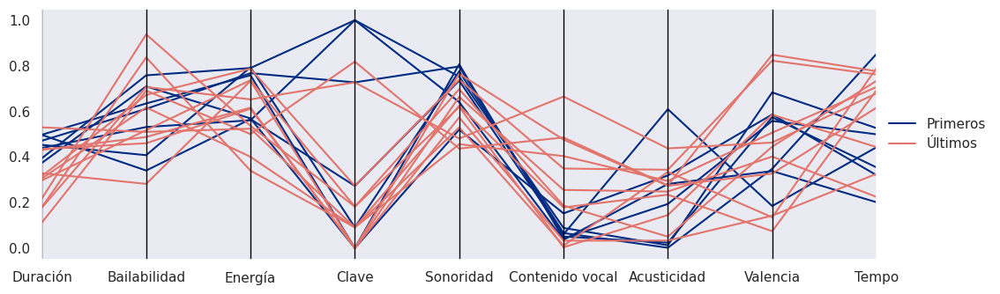

In [ ]:
from pandas.plotting import parallel_coordinates
plt.rcParams["figure.figsize"] = [11.50, 3.50]
plt.rcParams["figure.autolayout"] = True
fig, ax = plt.subplots()
parallel_coordinates(C1D2, "Ranking", color=('#002b82','#e3746b'), ax = ax)
ax.grid(False)
# Put a legend to the right of the current axis
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

**De los últimos 5 años**

In [ ]:
D1año = Top100[(Top100["Fecha"].dt.year >= 2017) & (Top100["Fecha"].dt.year <= 2021)]
#El dataframe resultante cuenta apariciones en función de la canción y de la posición
D20 = pd.crosstab(D1año["Canción ID"], D1año["Ranking"])
#Después se suman todos los valores, porque no importa la posición, solo que haya estado
D20.insert(100, "Cantidad de semanas", D20.sum(axis = 1))
#Se eliminan las posiciones porque no son relevantes
D20 = D20.drop(columns = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100])
n = 15
C1D2head = D20.sort_values("Cantidad de semanas", ascending = False).head(n)
C1D2tail = D20.sort_values("Cantidad de semanas", ascending = False).tail(n)
#Después hay que agregar las columnas de las propiedades
#Este array es para identificar según el orden de la cantidad de semanas
arrayhead = np.arange(1,n+1)
#Acá se agregan las columnas HEAD
C1D2head.insert(1, "Posición", arrayhead)
C1D2head.insert(2, "Década", 1)
C1D2head.insert(3, "Duración", 0)
C1D2head.insert(4, "Bailabilidad", 0)
C1D2head.insert(5, "Energía", 0)
C1D2head.insert(6, "Clave", 0)
C1D2head.insert(7, "Sonoridad", 0)
C1D2head.insert(8, "Contenido vocal", 0)
C1D2head.insert(9, "Acusticidad", 0)
C1D2head.insert(10, "Valencia", 0)
C1D2head.insert(11, "Tempo", 0)
#Acá se agregan las columnas TAIL
arraytail = -np.arange(1,n+1)
C1D2tail.insert(1, "Posición", arraytail)
C1D2tail.insert(2, "Década", 1)
C1D2tail.insert(3, "Duración", 0)
C1D2tail.insert(4, "Bailabilidad", 0)
C1D2tail.insert(5, "Energía", 0)
C1D2tail.insert(6, "Clave", 0)
C1D2tail.insert(7, "Sonoridad", 0)
C1D2tail.insert(8, "Contenido vocal", 0)
C1D2tail.insert(8, "Acusticidad", 0)
C1D2tail.insert(10, "Valencia", 0)
C1D2tail.insert(11, "Tempo", 0)
#Agrega los atributos
for i in range(0,scaled_df.shape[0]):
  m = C1D2head.index
  for j in range (0,C1D2head.shape[0]):
    if Canción.iloc[i,0] == m[j]:
      C1D2head.iloc[j,3] = scaled_df.iloc[i,1] #Duración
      C1D2head.iloc[j,4] = scaled_df.iloc[i,2] #
      C1D2head.iloc[j,5] = scaled_df.iloc[i,3]
      C1D2head.iloc[j,6] = scaled_df.iloc[i,4]
      C1D2head.iloc[j,7] = scaled_df.iloc[i,5]
      C1D2head.iloc[j,8] = scaled_df.iloc[i,6]
      C1D2head.iloc[j,9] = scaled_df.iloc[i,7]
      C1D2head.iloc[j,10] = scaled_df.iloc[i,8]
      C1D2head.iloc[j,11] = scaled_df.iloc[i,9] #Tempo
#TAIL
for i in range(0,scaled_df.shape[0]):
  m = C1D2tail.index
  for j in range (0,C1D2tail.shape[0]):
    if Canción.iloc[i,0] == m[j]:
      C1D2tail.iloc[j,3] = scaled_df.iloc[i,1] #Duración
      C1D2tail.iloc[j,4] = scaled_df.iloc[i,2] #Bailabilidad
      C1D2tail.iloc[j,5] = scaled_df.iloc[i,3] #Energía
      C1D2tail.iloc[j,6] = scaled_df.iloc[i,4] #Clave
      C1D2tail.iloc[j,7] = scaled_df.iloc[i,5] #Sonoridad
      C1D2tail.iloc[j,8] = scaled_df.iloc[i,6] #Contenido vocal
      C1D2tail.iloc[j,9] = scaled_df.iloc[i,7] #Acusticidad
      C1D2tail.iloc[j,10] = scaled_df.iloc[i,8] #Valencia
      C1D2tail.iloc[j,11] = scaled_df.iloc[i,9] #Tempo
C1D2head.insert(12, "Ranking", "x")
C1D2tail.insert(12, "Ranking", "x")
C1D2 = pd.concat([C1D2head, C1D2tail], axis = 0)
for i in range(0,C1D2.shape[0]): 
  if C1D2.iloc[i,1] <= 0:
    C1D2.iloc[i,12] = "Últimos"
  else:
    C1D2.iloc[i,12] = "Primeros"
#Ahora lo tengo que normalizar, solo pasandole los valores cuantitativos
C1D2 = C1D2.dropna(axis = 0)
C1D2 = C1D2.drop(columns = ["Cantidad de semanas", "Década", "Posición"])

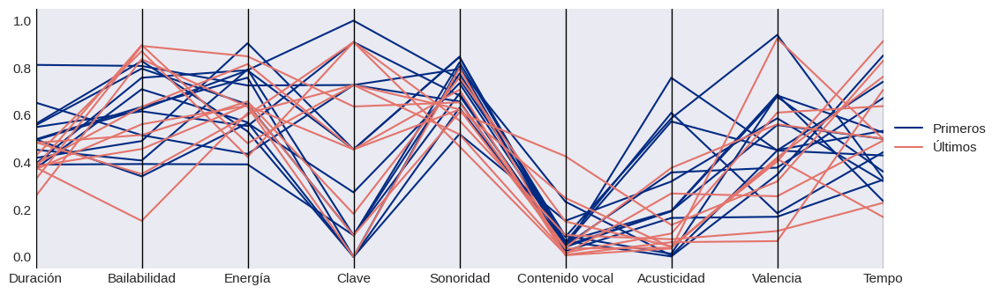

In [ ]:
from pandas.plotting import parallel_coordinates
plt.rcParams["figure.figsize"] = [11.50, 3.50]
plt.rcParams["figure.autolayout"] = True
fig, ax = plt.subplots()
parallel_coordinates(C1D2, "Ranking", color=('#002b82','#e3746b'), ax = ax)
ax.grid(False)
# Put a legend to the right of the current axis
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

**De todos los tiempos**

In [ ]:
#El dataframe resultante cuenta apariciones en función de la canción y de la posición
D20 = pd.crosstab(Top100["Canción ID"], Top100["Ranking"])
#Después se suman todos los valores, porque no importa la posición, solo que haya estado
D20.insert(100, "Cantidad de semanas", D20.sum(axis = 1))
#Se eliminan las posiciones porque no son relevantes
D20 = D20.drop(columns = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100])
n = 15
C1D2head = D20.sort_values("Cantidad de semanas", ascending = False).head(n)
C1D2tail = D20.sort_values("Cantidad de semanas", ascending = False).tail(n)
#Después hay que agregar las columnas de las propiedades
#Este array es para identificar según el orden de la cantidad de semanas
arrayhead = np.arange(1,n+1)
#Acá se agregan las columnas HEAD
C1D2head.insert(1, "Posición", arrayhead)
C1D2head.insert(2, "Década", 1)
C1D2head.insert(3, "Duración", 0)
C1D2head.insert(4, "Bailabilidad", 0)
C1D2head.insert(5, "Energía", 0)
C1D2head.insert(6, "Clave", 0)
C1D2head.insert(7, "Sonoridad", 0)
C1D2head.insert(8, "Contenido vocal", 0)
C1D2head.insert(9, "Acusticidad", 0)
C1D2head.insert(10, "Valencia", 0)
C1D2head.insert(11, "Tempo", 0)
#Acá se agregan las columnas TAIL
arraytail = -np.arange(1,n+1)
C1D2tail.insert(1, "Posición", arraytail)
C1D2tail.insert(2, "Década", 1)
C1D2tail.insert(3, "Duración", 0)
C1D2tail.insert(4, "Bailabilidad", 0)
C1D2tail.insert(5, "Energía", 0)
C1D2tail.insert(6, "Clave", 0)
C1D2tail.insert(7, "Sonoridad", 0)
C1D2tail.insert(8, "Contenido vocal", 0)
C1D2tail.insert(8, "Acusticidad", 0)
C1D2tail.insert(10, "Valencia", 0)
C1D2tail.insert(11, "Tempo", 0)
#Agrega los atributos
for i in range(0,scaled_df.shape[0]):
  m = C1D2head.index
  for j in range (0,C1D2head.shape[0]):
    if Canción.iloc[i,0] == m[j]:
      C1D2head.iloc[j,3] = scaled_df.iloc[i,1] #Duración
      C1D2head.iloc[j,4] = scaled_df.iloc[i,2] #
      C1D2head.iloc[j,5] = scaled_df.iloc[i,3]
      C1D2head.iloc[j,6] = scaled_df.iloc[i,4]
      C1D2head.iloc[j,7] = scaled_df.iloc[i,5]
      C1D2head.iloc[j,8] = scaled_df.iloc[i,6]
      C1D2head.iloc[j,9] = scaled_df.iloc[i,7]
      C1D2head.iloc[j,10] = scaled_df.iloc[i,8]
      C1D2head.iloc[j,11] = scaled_df.iloc[i,9] #Tempo
#TAIL
for i in range(0,scaled_df.shape[0]):
  m = C1D2tail.index
  for j in range (0,C1D2tail.shape[0]):
    if Canción.iloc[i,0] == m[j]:
      C1D2tail.iloc[j,3] = scaled_df.iloc[i,1] #Duración
      C1D2tail.iloc[j,4] = scaled_df.iloc[i,2] #Bailabilidad
      C1D2tail.iloc[j,5] = scaled_df.iloc[i,3] #Energía
      C1D2tail.iloc[j,6] = scaled_df.iloc[i,4] #Clave
      C1D2tail.iloc[j,7] = scaled_df.iloc[i,5] #Sonoridad
      C1D2tail.iloc[j,8] = scaled_df.iloc[i,6] #Contenido vocal
      C1D2tail.iloc[j,9] = scaled_df.iloc[i,7] #Acusticidad
      C1D2tail.iloc[j,10] = scaled_df.iloc[i,8] #Valencia
      C1D2tail.iloc[j,11] = scaled_df.iloc[i,9] #Tempo
C1D2head.insert(12, "Ranking", "x")
C1D2tail.insert(12, "Ranking", "x")
C1D2 = pd.concat([C1D2head, C1D2tail], axis = 0)
for i in range(0,C1D2.shape[0]): 
  if C1D2.iloc[i,1] <= 0:
    C1D2.iloc[i,12] = "Últimos"
  else:
    C1D2.iloc[i,12] = "Primeros"
#Ahora lo tengo que normalizar, solo pasandole los valores cuantitativos
C1D2 = C1D2.dropna(axis = 0)
C1D2 = C1D2.drop(columns = ["Cantidad de semanas", "Década", "Posición"])

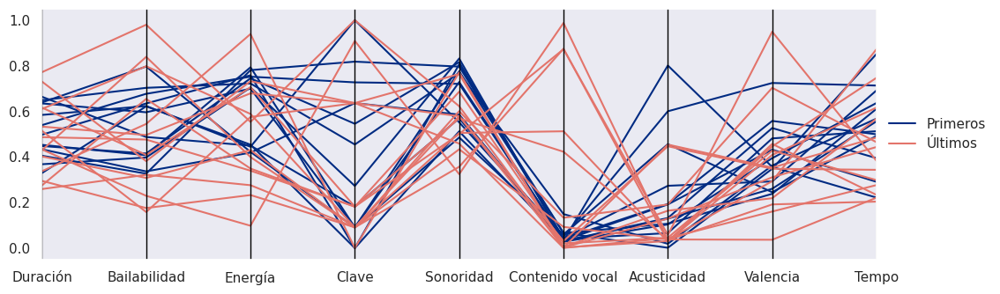

In [ ]:
from pandas.plotting import parallel_coordinates
plt.rcParams["figure.figsize"] = [11.50, 3.50]
plt.rcParams["figure.autolayout"] = True
fig, ax = plt.subplots()
parallel_coordinates(C1D2, "Ranking", color=('#002b82','#e3746b'), ax = ax)
ax.grid(False)
# Put a legend to the right of the current axis
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

### **Criterio 2: Canciones con más semanas en el top 10**

**Del último año**


In [ ]:
D1año = Top100[(Top100["Fecha"].dt.year >= 2020) & (Top100["Fecha"].dt.year <= 2021)]
#El dataframe resultante cuenta apariciones en función de la canción y de la posición
D20 = pd.crosstab(D1año["Canción ID"], D1año["Ranking"])
#Se eliminan algunas posiciones porque no son relevantes
D20 = D20.drop(columns = [11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100])
D20 = D20.rename(columns = {1:"1",2:"2",3:"3",4:"4",5:"5",6:"6",7:"7",8:"8",9:"9",10:"10"})
#Después se suman todos los valores del 1 al 10
D20.insert(10, "Cantidad de semanas", D20.sum(axis = 1))
n = 15
C1D2head = D20.sort_values("Cantidad de semanas", ascending = False).head(n)
C1D2tail = D20.sort_values("Cantidad de semanas", ascending = False).tail(n)
#Después hay que agregar las columnas de las propiedades
#Este array es para identificar según el orden de la cantidad de semanas
arrayhead = np.arange(1,n+1)
#Acá se agregan las columnas HEAD
C1D2head.insert(1, "Posición", arrayhead)
C1D2head.insert(2, "Década", 1)
C1D2head.insert(3, "Duración", 0)
C1D2head.insert(4, "Bailabilidad", 0)
C1D2head.insert(5, "Energía", 0)
C1D2head.insert(6, "Clave", 0)
C1D2head.insert(7, "Sonoridad", 0)
C1D2head.insert(8, "Contenido vocal", 0)
C1D2head.insert(9, "Acusticidad", 0)
C1D2head.insert(10, "Valencia", 0)
C1D2head.insert(11, "Tempo", 0)
#Acá se agregan las columnas TAIL
arraytail = -np.arange(1,n+1)
C1D2tail.insert(1, "Posición", arraytail)
C1D2tail.insert(2, "Década", 1)
C1D2tail.insert(3, "Duración", 0)
C1D2tail.insert(4, "Bailabilidad", 0)
C1D2tail.insert(5, "Energía", 0)
C1D2tail.insert(6, "Clave", 0)
C1D2tail.insert(7, "Sonoridad", 0)
C1D2tail.insert(8, "Contenido vocal", 0)
C1D2tail.insert(8, "Acusticidad", 0)
C1D2tail.insert(10, "Valencia", 0)
C1D2tail.insert(11, "Tempo", 0)
#Agrega los atributos
for i in range(0,scaled_df.shape[0]):
  m = C1D2head.index
  for j in range (0,C1D2head.shape[0]):
    if Canción.iloc[i,0] == m[j]:
      C1D2head.iloc[j,3] = scaled_df.iloc[i,1] #Duración
      C1D2head.iloc[j,4] = scaled_df.iloc[i,2] #
      C1D2head.iloc[j,5] = scaled_df.iloc[i,3]
      C1D2head.iloc[j,6] = scaled_df.iloc[i,4]
      C1D2head.iloc[j,7] = scaled_df.iloc[i,5]
      C1D2head.iloc[j,8] = scaled_df.iloc[i,6]
      C1D2head.iloc[j,9] = scaled_df.iloc[i,7]
      C1D2head.iloc[j,10] = scaled_df.iloc[i,8]
      C1D2head.iloc[j,11] = scaled_df.iloc[i,9] #Tempo
#TAIL
for i in range(0,scaled_df.shape[0]):
  m = C1D2tail.index
  for j in range (0,C1D2tail.shape[0]):
    if Canción.iloc[i,0] == m[j]:
      C1D2tail.iloc[j,3] = scaled_df.iloc[i,1] #Duración
      C1D2tail.iloc[j,4] = scaled_df.iloc[i,2] #Bailabilidad
      C1D2tail.iloc[j,5] = scaled_df.iloc[i,3] #Energía
      C1D2tail.iloc[j,6] = scaled_df.iloc[i,4] #Clave
      C1D2tail.iloc[j,7] = scaled_df.iloc[i,5] #Sonoridad
      C1D2tail.iloc[j,8] = scaled_df.iloc[i,6] #Contenido vocal
      C1D2tail.iloc[j,9] = scaled_df.iloc[i,7] #Acusticidad
      C1D2tail.iloc[j,10] = scaled_df.iloc[i,8] #Valencia
      C1D2tail.iloc[j,11] = scaled_df.iloc[i,9] #Tempo
C1D2head.insert(12, "Ranking", "x")
C1D2tail.insert(12, "Ranking", "x")
C1D2 = pd.concat([C1D2head, C1D2tail], axis = 0)
for i in range(0,C1D2.shape[0]): 
  if C1D2.iloc[i,1] <= 0:
    C1D2.iloc[i,12] = "Últimos"
  else:
    C1D2.iloc[i,12] = "Primeros"
#Ahora lo tengo que normalizar, solo pasandole los valores cuantitativos
C1D2 = C1D2.dropna(axis = 0)
C1D2 = C1D2.drop(columns = ["1","2","3","4","5","6","7","8","9","10","Cantidad de semanas", "Década", "Posición"])

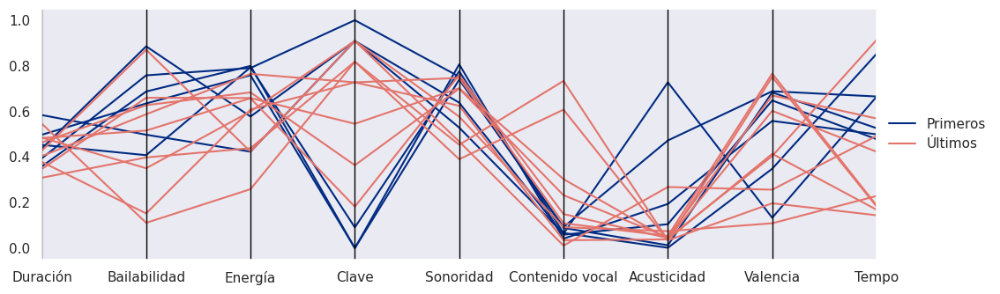

In [ ]:
from pandas.plotting import parallel_coordinates
plt.rcParams["figure.figsize"] = [11.50, 3.50]
plt.rcParams["figure.autolayout"] = True
fig, ax = plt.subplots()
parallel_coordinates(C1D2, "Ranking", color=('#002b82','#e3746b'), ax = ax)
ax.grid(False)
# Put a legend to the right of the current axis
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

**De los últimos 5 años**

In [ ]:
D5años = Top100[(Top100["Fecha"].dt.year >= 2017) & (Top100["Fecha"].dt.year <= 2021)]
#El dataframe resultante cuenta apariciones en función de la canción y de la posición
D20 = pd.crosstab(D5años["Canción ID"], D5años["Ranking"])
#Se eliminan algunas posiciones porque no son relevantes
D20 = D20.drop(columns = [11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100])
D20 = D20.rename(columns = {1:"1",2:"2",3:"3",4:"4",5:"5",6:"6",7:"7",8:"8",9:"9",10:"10"})
#Después se suman todos los valores del 1 al 10
D20.insert(10, "Cantidad de semanas", D20.sum(axis = 1))
n = 15
C1D2head = D20.sort_values("Cantidad de semanas", ascending = False).head(n)
C1D2tail = D20.sort_values("Cantidad de semanas", ascending = False).tail(n)
#Después hay que agregar las columnas de las propiedades
#Este array es para identificar según el orden de la cantidad de semanas
arrayhead = np.arange(1,n+1)
#Acá se agregan las columnas HEAD
C1D2head.insert(1, "Posición", arrayhead)
C1D2head.insert(2, "Década", 1)
C1D2head.insert(3, "Duración", 0)
C1D2head.insert(4, "Bailabilidad", 0)
C1D2head.insert(5, "Energía", 0)
C1D2head.insert(6, "Clave", 0)
C1D2head.insert(7, "Sonoridad", 0)
C1D2head.insert(8, "Contenido vocal", 0)
C1D2head.insert(9, "Acusticidad", 0)
C1D2head.insert(10, "Valencia", 0)
C1D2head.insert(11, "Tempo", 0)
#Acá se agregan las columnas TAIL
arraytail = -np.arange(1,n+1)
C1D2tail.insert(1, "Posición", arraytail)
C1D2tail.insert(2, "Década", 1)
C1D2tail.insert(3, "Duración", 0)
C1D2tail.insert(4, "Bailabilidad", 0)
C1D2tail.insert(5, "Energía", 0)
C1D2tail.insert(6, "Clave", 0)
C1D2tail.insert(7, "Sonoridad", 0)
C1D2tail.insert(8, "Contenido vocal", 0)
C1D2tail.insert(8, "Acusticidad", 0)
C1D2tail.insert(10, "Valencia", 0)
C1D2tail.insert(11, "Tempo", 0)
#Agrega los atributos
for i in range(0,scaled_df.shape[0]):
  m = C1D2head.index
  for j in range (0,C1D2head.shape[0]):
    if Canción.iloc[i,0] == m[j]:
      C1D2head.iloc[j,3] = scaled_df.iloc[i,1] #Duración
      C1D2head.iloc[j,4] = scaled_df.iloc[i,2] #
      C1D2head.iloc[j,5] = scaled_df.iloc[i,3]
      C1D2head.iloc[j,6] = scaled_df.iloc[i,4]
      C1D2head.iloc[j,7] = scaled_df.iloc[i,5]
      C1D2head.iloc[j,8] = scaled_df.iloc[i,6]
      C1D2head.iloc[j,9] = scaled_df.iloc[i,7]
      C1D2head.iloc[j,10] = scaled_df.iloc[i,8]
      C1D2head.iloc[j,11] = scaled_df.iloc[i,9] #Tempo
#TAIL
for i in range(0,scaled_df.shape[0]):
  m = C1D2tail.index
  for j in range (0,C1D2tail.shape[0]):
    if Canción.iloc[i,0] == m[j]:
      C1D2tail.iloc[j,3] = scaled_df.iloc[i,1] #Duración
      C1D2tail.iloc[j,4] = scaled_df.iloc[i,2] #Bailabilidad
      C1D2tail.iloc[j,5] = scaled_df.iloc[i,3] #Energía
      C1D2tail.iloc[j,6] = scaled_df.iloc[i,4] #Clave
      C1D2tail.iloc[j,7] = scaled_df.iloc[i,5] #Sonoridad
      C1D2tail.iloc[j,8] = scaled_df.iloc[i,6] #Contenido vocal
      C1D2tail.iloc[j,9] = scaled_df.iloc[i,7] #Acusticidad
      C1D2tail.iloc[j,10] = scaled_df.iloc[i,8] #Valencia
      C1D2tail.iloc[j,11] = scaled_df.iloc[i,9] #Tempo
C1D2head.insert(12, "Ranking", "x")
C1D2tail.insert(12, "Ranking", "x")
C1D2 = pd.concat([C1D2head, C1D2tail], axis = 0)
for i in range(0,C1D2.shape[0]): 
  if C1D2.iloc[i,1] <= 0:
    C1D2.iloc[i,12] = "Últimos"
  else:
    C1D2.iloc[i,12] = "Primeros"
#Ahora lo tengo que normalizar, solo pasandole los valores cuantitativos
C1D2 = C1D2.dropna(axis = 0)
C1D2 = C1D2.drop(columns = ["1","2","3","4","5","6","7","8","9","10","Cantidad de semanas", "Década", "Posición"])

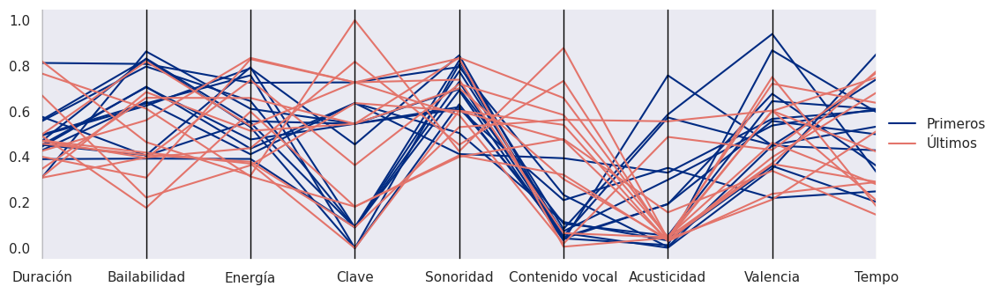

In [ ]:
from pandas.plotting import parallel_coordinates
plt.rcParams["figure.figsize"] = [11.50, 3.50]
plt.rcParams["figure.autolayout"] = True
fig, ax = plt.subplots()
parallel_coordinates(C1D2, "Ranking", color=('#002b82','#e3746b'), ax = ax)
ax.grid(False)
# Put a legend to the right of the current axis
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

**De todos los tiempos**

In [ ]:
#El dataframe resultante cuenta apariciones en función de la canción y de la posición
D20 = pd.crosstab(Top100["Canción ID"], Top100["Ranking"])
#Se eliminan algunas posiciones porque no son relevantes
D20 = D20.drop(columns = [11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100])
D20 = D20.rename(columns = {1:"1",2:"2",3:"3",4:"4",5:"5",6:"6",7:"7",8:"8",9:"9",10:"10"})
#Después se suman todos los valores del 1 al 10
D20.insert(10, "Cantidad de semanas", D20.sum(axis = 1))
n = 15
C1D2head = D20.sort_values("Cantidad de semanas", ascending = False).head(n)
C1D2tail = D20.sort_values("Cantidad de semanas", ascending = False).tail(n)
#Después hay que agregar las columnas de las propiedades
#Este array es para identificar según el orden de la cantidad de semanas
arrayhead = np.arange(1,n+1)
#Acá se agregan las columnas HEAD
C1D2head.insert(1, "Posición", arrayhead)
C1D2head.insert(2, "Década", 1)
C1D2head.insert(3, "Duración", 0)
C1D2head.insert(4, "Bailabilidad", 0)
C1D2head.insert(5, "Energía", 0)
C1D2head.insert(6, "Clave", 0)
C1D2head.insert(7, "Sonoridad", 0)
C1D2head.insert(8, "Contenido vocal", 0)
C1D2head.insert(9, "Acusticidad", 0)
C1D2head.insert(10, "Valencia", 0)
C1D2head.insert(11, "Tempo", 0)
#Acá se agregan las columnas TAIL
arraytail = -np.arange(1,n+1)
C1D2tail.insert(1, "Posición", arraytail)
C1D2tail.insert(2, "Década", 1)
C1D2tail.insert(3, "Duración", 0)
C1D2tail.insert(4, "Bailabilidad", 0)
C1D2tail.insert(5, "Energía", 0)
C1D2tail.insert(6, "Clave", 0)
C1D2tail.insert(7, "Sonoridad", 0)
C1D2tail.insert(8, "Contenido vocal", 0)
C1D2tail.insert(8, "Acusticidad", 0)
C1D2tail.insert(10, "Valencia", 0)
C1D2tail.insert(11, "Tempo", 0)
#Agrega los atributos
for i in range(0,scaled_df.shape[0]):
  m = C1D2head.index
  for j in range (0,C1D2head.shape[0]):
    if Canción.iloc[i,0] == m[j]:
      C1D2head.iloc[j,3] = scaled_df.iloc[i,1] #Duración
      C1D2head.iloc[j,4] = scaled_df.iloc[i,2] #
      C1D2head.iloc[j,5] = scaled_df.iloc[i,3]
      C1D2head.iloc[j,6] = scaled_df.iloc[i,4]
      C1D2head.iloc[j,7] = scaled_df.iloc[i,5]
      C1D2head.iloc[j,8] = scaled_df.iloc[i,6]
      C1D2head.iloc[j,9] = scaled_df.iloc[i,7]
      C1D2head.iloc[j,10] = scaled_df.iloc[i,8]
      C1D2head.iloc[j,11] = scaled_df.iloc[i,9] #Tempo
#TAIL
for i in range(0,scaled_df.shape[0]):
  m = C1D2tail.index
  for j in range (0,C1D2tail.shape[0]):
    if Canción.iloc[i,0] == m[j]:
      C1D2tail.iloc[j,3] = scaled_df.iloc[i,1] #Duración
      C1D2tail.iloc[j,4] = scaled_df.iloc[i,2] #Bailabilidad
      C1D2tail.iloc[j,5] = scaled_df.iloc[i,3] #Energía
      C1D2tail.iloc[j,6] = scaled_df.iloc[i,4] #Clave
      C1D2tail.iloc[j,7] = scaled_df.iloc[i,5] #Sonoridad
      C1D2tail.iloc[j,8] = scaled_df.iloc[i,6] #Contenido vocal
      C1D2tail.iloc[j,9] = scaled_df.iloc[i,7] #Acusticidad
      C1D2tail.iloc[j,10] = scaled_df.iloc[i,8] #Valencia
      C1D2tail.iloc[j,11] = scaled_df.iloc[i,9] #Tempo
C1D2head.insert(12, "Ranking", "x")
C1D2tail.insert(12, "Ranking", "x")
C1D2 = pd.concat([C1D2head, C1D2tail], axis = 0)
for i in range(0,C1D2.shape[0]): 
  if C1D2.iloc[i,1] <= 0:
    C1D2.iloc[i,12] = "Últimos"
  else:
    C1D2.iloc[i,12] = "Primeros"
#Ahora lo tengo que normalizar, solo pasandole los valores cuantitativos
C1D2 = C1D2.dropna(axis = 0)
C1D2 = C1D2.drop(columns = ["1","2","3","4","5","6","7","8","9","10","Cantidad de semanas", "Década", "Posición"])

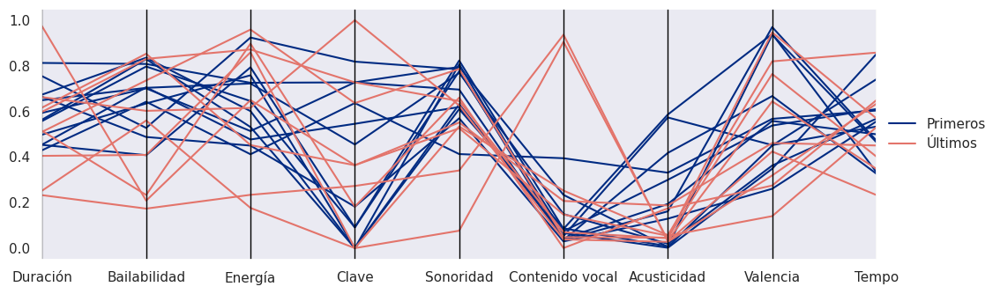

In [ ]:
from pandas.plotting import parallel_coordinates
plt.rcParams["figure.figsize"] = [11.50, 3.50]
plt.rcParams["figure.autolayout"] = True
fig, ax = plt.subplots()
parallel_coordinates(C1D2, "Ranking", color=('#002b82','#e3746b'), ax = ax)
ax.grid(False)
# Put a legend to the right of the current axis
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

### **Criterio 3: Canciones con más semanas en la posición número 1**

**Del último año**

In [ ]:
D1año = Top100[(Top100["Fecha"].dt.year >= 2020) & (Top100["Fecha"].dt.year <= 2021)]
#El dataframe resultante cuenta apariciones en función de la canción y de la posición
n = 15
D = pd.crosstab(D1año["Canción ID"], D1año["Ranking"])
#Se eliminan todas las posiciones, menos la número 1
D = D.drop(columns = [2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100])
D = D.rename(columns = {1:"Cantidad de semanas Nº1"})
C1Dhead = D.sort_values(by = "Cantidad de semanas Nº1", ascending = False).head(n)
C1Dtail = D.sort_values(by = "Cantidad de semanas Nº1", ascending = False).tail(n)
#Después hay que agregar las columnas de las propiedades
#Este array es para identificar según el orden de la cantidad de semanas
arrayhead = np.arange(1,n+1)
#Acá se agregan las columnas HEAD
C1Dhead.insert(1, "Posición", arrayhead)
C1Dhead.insert(2, "Década", 1)
C1Dhead.insert(3, "Duración", 0)
C1Dhead.insert(4, "Bailabilidad", 0)
C1Dhead.insert(5, "Energía", 0)
C1Dhead.insert(6, "Clave", 0)
C1Dhead.insert(7, "Sonoridad", 0)
C1Dhead.insert(8, "Contenido vocal", 0)
C1Dhead.insert(9, "Acusticidad", 0)
C1Dhead.insert(10, "Valencia", 0)
C1Dhead.insert(11, "Tempo", 0)
#Acá se agregan las columnas TAIL
arraytail = -np.arange(1,n+1)
C1Dtail.insert(1, "Posición", arraytail)
C1Dtail.insert(2, "Década", 1)
C1Dtail.insert(3, "Duración", 0)
C1Dtail.insert(4, "Bailabilidad", 0)
C1Dtail.insert(5, "Energía", 0)
C1Dtail.insert(6, "Clave", 0)
C1Dtail.insert(7, "Sonoridad", 0)
C1Dtail.insert(8, "Contenido vocal", 0)
C1Dtail.insert(8, "Acusticidad", 0)
C1Dtail.insert(10, "Valencia", 0)
C1Dtail.insert(11, "Tempo", 0)
#Agrega los atributos
for i in range(0,scaled_df.shape[0]):
  m = C1Dhead.index
  for j in range (0,C1Dhead.shape[0]):
    if Canción.iloc[i,0] == m[j]:
      C1Dhead.iloc[j,3] = scaled_df.iloc[i,1] #Duración
      C1Dhead.iloc[j,4] = scaled_df.iloc[i,2] #
      C1Dhead.iloc[j,5] = scaled_df.iloc[i,3]
      C1Dhead.iloc[j,6] = scaled_df.iloc[i,4]
      C1Dhead.iloc[j,7] = scaled_df.iloc[i,5]
      C1Dhead.iloc[j,8] = scaled_df.iloc[i,6]
      C1Dhead.iloc[j,9] = scaled_df.iloc[i,7]
      C1Dhead.iloc[j,10] = scaled_df.iloc[i,8]
      C1Dhead.iloc[j,11] = scaled_df.iloc[i,9] #Tempo
#TAIL
for i in range(0,scaled_df.shape[0]):
  m = C1Dtail.index
  for j in range (0,C1Dtail.shape[0]):
    if Canción.iloc[i,0] == m[j]:
      C1Dtail.iloc[j,3] = scaled_df.iloc[i,1] #Duración
      C1Dtail.iloc[j,4] = scaled_df.iloc[i,2] #Bailabilidad
      C1Dtail.iloc[j,5] = scaled_df.iloc[i,3] #Energía
      C1Dtail.iloc[j,6] = scaled_df.iloc[i,4] #Clave
      C1Dtail.iloc[j,7] = scaled_df.iloc[i,5] #Sonoridad
      C1Dtail.iloc[j,8] = scaled_df.iloc[i,6] #Contenido vocal
      C1Dtail.iloc[j,9] = scaled_df.iloc[i,7] #Acusticidad
      C1Dtail.iloc[j,10] = scaled_df.iloc[i,8] #Valencia
      C1Dtail.iloc[j,11] = scaled_df.iloc[i,9] #Tempo
C1Dhead.insert(12, "Ranking", "x")
C1Dtail.insert(12, "Ranking", "x")
C1D = pd.concat([C1Dhead, C1Dtail], axis = 0)
for i in range(0,C1D.shape[0]): 
  if C1D.iloc[i,1] <= 0:
    C1D.iloc[i,12] = "Últimos"
  else:
    C1D.iloc[i,12] = "Primeros"
#Ahora lo tengo que normalizar, solo pasandole los valores cuantitativos
C1D = C1D.dropna(axis = 0)
C1D = C1D.drop(columns = ["Cantidad de semanas Nº1", "Década", "Posición"])

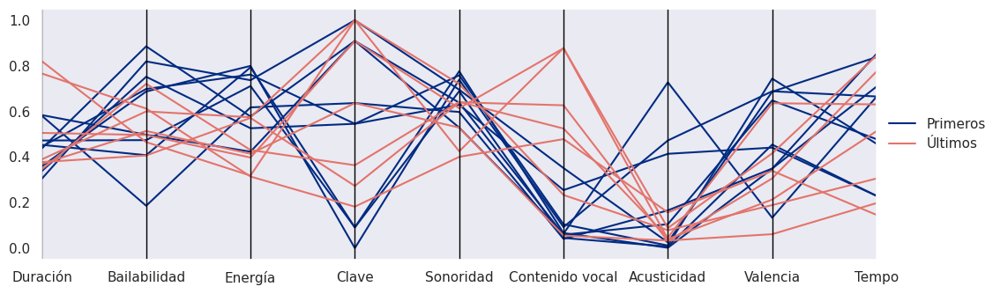

In [ ]:
from pandas.plotting import parallel_coordinates
fig, ax = plt.subplots()
#plt.style.use("seaborn-v0_8-bright")
parallel_coordinates(C1D, "Ranking", color=('#002b82','#e3746b'), ax = ax)
ax.grid(False)
# Put a legend to the right of the current axis
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

**De los últimos 5 años**

In [ ]:
D5años = Top100[(Top100["Fecha"].dt.year >= 2017) & (Top100["Fecha"].dt.year <= 2021)]
#El dataframe resultante cuenta apariciones en función de la canción y de la posición
n = 15
D = pd.crosstab(D5años["Canción ID"], D5años["Ranking"])
#Se eliminan todas las posiciones, menos la número 1
D = D.drop(columns = [2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100])
D = D.rename(columns = {1:"Cantidad de semanas Nº1"})
C1Dhead = D.sort_values(by = "Cantidad de semanas Nº1", ascending = False).head(n)
C1Dtail = D.sort_values(by = "Cantidad de semanas Nº1", ascending = False).tail(n)
#Después hay que agregar las columnas de las propiedades
#Este array es para identificar según el orden de la cantidad de semanas
arrayhead = np.arange(1,n+1)
#Acá se agregan las columnas HEAD
C1Dhead.insert(1, "Posición", arrayhead)
C1Dhead.insert(2, "Década", 1)
C1Dhead.insert(3, "Duración", 0)
C1Dhead.insert(4, "Bailabilidad", 0)
C1Dhead.insert(5, "Energía", 0)
C1Dhead.insert(6, "Clave", 0)
C1Dhead.insert(7, "Sonoridad", 0)
C1Dhead.insert(8, "Contenido vocal", 0)
C1Dhead.insert(9, "Acusticidad", 0)
C1Dhead.insert(10, "Valencia", 0)
C1Dhead.insert(11, "Tempo", 0)
#Acá se agregan las columnas TAIL
arraytail = -np.arange(1,n+1)
C1Dtail.insert(1, "Posición", arraytail)
C1Dtail.insert(2, "Década", 1)
C1Dtail.insert(3, "Duración", 0)
C1Dtail.insert(4, "Bailabilidad", 0)
C1Dtail.insert(5, "Energía", 0)
C1Dtail.insert(6, "Clave", 0)
C1Dtail.insert(7, "Sonoridad", 0)
C1Dtail.insert(8, "Contenido vocal", 0)
C1Dtail.insert(8, "Acusticidad", 0)
C1Dtail.insert(10, "Valencia", 0)
C1Dtail.insert(11, "Tempo", 0)
#Agrega los atributos
for i in range(0,scaled_df.shape[0]):
  m = C1Dhead.index
  for j in range (0,C1Dhead.shape[0]):
    if Canción.iloc[i,0] == m[j]:
      C1Dhead.iloc[j,3] = scaled_df.iloc[i,1] #Duración
      C1Dhead.iloc[j,4] = scaled_df.iloc[i,2] #
      C1Dhead.iloc[j,5] = scaled_df.iloc[i,3]
      C1Dhead.iloc[j,6] = scaled_df.iloc[i,4]
      C1Dhead.iloc[j,7] = scaled_df.iloc[i,5]
      C1Dhead.iloc[j,8] = scaled_df.iloc[i,6]
      C1Dhead.iloc[j,9] = scaled_df.iloc[i,7]
      C1Dhead.iloc[j,10] = scaled_df.iloc[i,8]
      C1Dhead.iloc[j,11] = scaled_df.iloc[i,9] #Tempo
#TAIL
for i in range(0,scaled_df.shape[0]):
  m = C1Dtail.index
  for j in range (0,C1Dtail.shape[0]):
    if Canción.iloc[i,0] == m[j]:
      C1Dtail.iloc[j,3] = scaled_df.iloc[i,1] #Duración
      C1Dtail.iloc[j,4] = scaled_df.iloc[i,2] #Bailabilidad
      C1Dtail.iloc[j,5] = scaled_df.iloc[i,3] #Energía
      C1Dtail.iloc[j,6] = scaled_df.iloc[i,4] #Clave
      C1Dtail.iloc[j,7] = scaled_df.iloc[i,5] #Sonoridad
      C1Dtail.iloc[j,8] = scaled_df.iloc[i,6] #Contenido vocal
      C1Dtail.iloc[j,9] = scaled_df.iloc[i,7] #Acusticidad
      C1Dtail.iloc[j,10] = scaled_df.iloc[i,8] #Valencia
      C1Dtail.iloc[j,11] = scaled_df.iloc[i,9] #Tempo
C1Dhead.insert(12, "Ranking", "x")
C1Dtail.insert(12, "Ranking", "x")
C1D = pd.concat([C1Dhead, C1Dtail], axis = 0)
for i in range(0,C1D.shape[0]): 
  if C1D.iloc[i,1] <= 0:
    C1D.iloc[i,12] = "Últimos"
  else:
    C1D.iloc[i,12] = "Primeros"
#Ahora lo tengo que normalizar, solo pasandole los valores cuantitativos
C1D = C1D.dropna(axis = 0)
C1D = C1D.drop(columns = ["Cantidad de semanas Nº1", "Década", "Posición"])

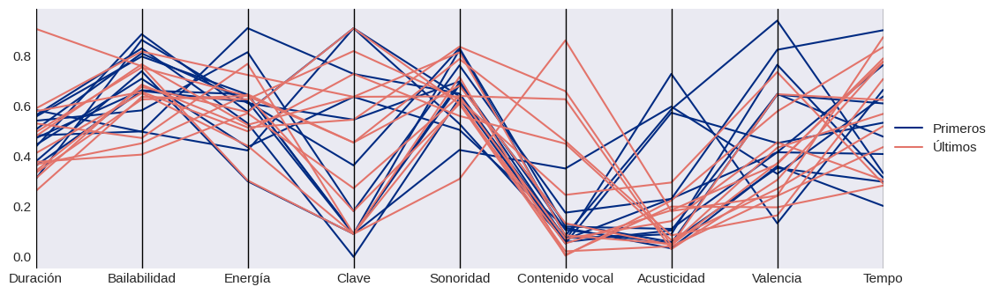

In [ ]:
from pandas.plotting import parallel_coordinates
fig, ax = plt.subplots()
#plt.style.use("seaborn-v0_8-bright")
parallel_coordinates(C1D, "Ranking", color=('#002b82','#e3746b'), ax = ax)
ax.grid(False)
# Put a legend to the right of the current axis
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

**De todos los tiempos**

In [ ]:
#El dataframe resultante cuenta apariciones en función de la canción y de la posición
n = 15
D = pd.crosstab(Top100["Canción ID"], Top100["Ranking"])
#Se eliminan todas las posiciones, menos la número 1
D = D.drop(columns = [2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100])
D = D.rename(columns = {1:"Cantidad de semanas Nº1"})
C1Dhead = D.sort_values(by = "Cantidad de semanas Nº1", ascending = False).head(n)
C1Dtail = D.sort_values(by = "Cantidad de semanas Nº1", ascending = False).tail(n)
#Después hay que agregar las columnas de las propiedades
#Este array es para identificar según el orden de la cantidad de semanas
arrayhead = np.arange(1,n+1)
#Acá se agregan las columnas HEAD
C1Dhead.insert(1, "Posición", arrayhead)
C1Dhead.insert(2, "Década", 1)
C1Dhead.insert(3, "Duración", 0)
C1Dhead.insert(4, "Bailabilidad", 0)
C1Dhead.insert(5, "Energía", 0)
C1Dhead.insert(6, "Clave", 0)
C1Dhead.insert(7, "Sonoridad", 0)
C1Dhead.insert(8, "Contenido vocal", 0)
C1Dhead.insert(9, "Acusticidad", 0)
C1Dhead.insert(10, "Valencia", 0)
C1Dhead.insert(11, "Tempo", 0)
#Acá se agregan las columnas TAIL
arraytail = -np.arange(1,n+1)
C1Dtail.insert(1, "Posición", arraytail)
C1Dtail.insert(2, "Década", 1)
C1Dtail.insert(3, "Duración", 0)
C1Dtail.insert(4, "Bailabilidad", 0)
C1Dtail.insert(5, "Energía", 0)
C1Dtail.insert(6, "Clave", 0)
C1Dtail.insert(7, "Sonoridad", 0)
C1Dtail.insert(8, "Contenido vocal", 0)
C1Dtail.insert(8, "Acusticidad", 0)
C1Dtail.insert(10, "Valencia", 0)
C1Dtail.insert(11, "Tempo", 0)
#Agrega los atributos
for i in range(0,scaled_df.shape[0]):
  m = C1Dhead.index
  for j in range (0,C1Dhead.shape[0]):
    if Canción.iloc[i,0] == m[j]:
      C1Dhead.iloc[j,3] = scaled_df.iloc[i,1] #Duración
      C1Dhead.iloc[j,4] = scaled_df.iloc[i,2] #
      C1Dhead.iloc[j,5] = scaled_df.iloc[i,3]
      C1Dhead.iloc[j,6] = scaled_df.iloc[i,4]
      C1Dhead.iloc[j,7] = scaled_df.iloc[i,5]
      C1Dhead.iloc[j,8] = scaled_df.iloc[i,6]
      C1Dhead.iloc[j,9] = scaled_df.iloc[i,7]
      C1Dhead.iloc[j,10] = scaled_df.iloc[i,8]
      C1Dhead.iloc[j,11] = scaled_df.iloc[i,9] #Tempo
#TAIL
for i in range(0,scaled_df.shape[0]):
  m = C1Dtail.index
  for j in range (0,C1Dtail.shape[0]):
    if Canción.iloc[i,0] == m[j]:
      C1Dtail.iloc[j,3] = scaled_df.iloc[i,1] #Duración
      C1Dtail.iloc[j,4] = scaled_df.iloc[i,2] #Bailabilidad
      C1Dtail.iloc[j,5] = scaled_df.iloc[i,3] #Energía
      C1Dtail.iloc[j,6] = scaled_df.iloc[i,4] #Clave
      C1Dtail.iloc[j,7] = scaled_df.iloc[i,5] #Sonoridad
      C1Dtail.iloc[j,8] = scaled_df.iloc[i,6] #Contenido vocal
      C1Dtail.iloc[j,9] = scaled_df.iloc[i,7] #Acusticidad
      C1Dtail.iloc[j,10] = scaled_df.iloc[i,8] #Valencia
      C1Dtail.iloc[j,11] = scaled_df.iloc[i,9] #Tempo
C1Dhead.insert(12, "Ranking", "x")
C1Dtail.insert(12, "Ranking", "x")
C1D = pd.concat([C1Dhead, C1Dtail], axis = 0)
for i in range(0,C1D.shape[0]): 
  if C1D.iloc[i,1] <= 0:
    C1D.iloc[i,12] = "Últimos"
  else:
    C1D.iloc[i,12] = "Primeros"
#Ahora lo tengo que normalizar, solo pasandole los valores cuantitativos
C1D = C1D.dropna(axis = 0)
C1D = C1D.drop(columns = ["Cantidad de semanas Nº1", "Década", "Posición"])

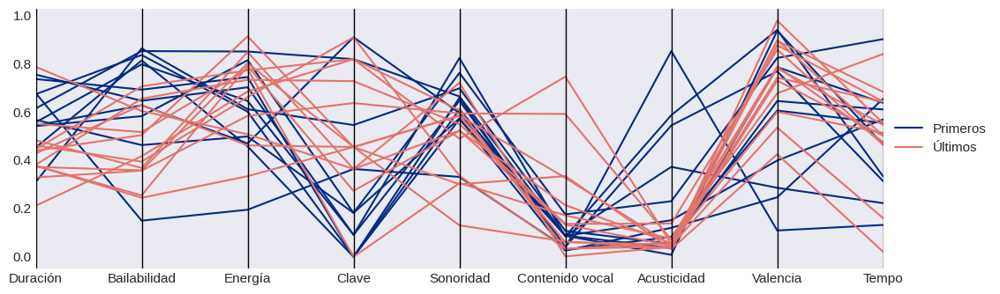

In [ ]:
from pandas.plotting import parallel_coordinates
fig, ax = plt.subplots()
plt.style.use("seaborn-v0_8-dark")
parallel_coordinates(C1D, "Ranking", color=('#002b82','#e3746b'), ax = ax)
ax.grid(False)
# Put a legend to the right of the current axis
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

## **Pregunta 2**

In [260]:
col = Género.columns
col = col.drop("Canción ID")
Género.insert(22, "Género", 0)
for i in range(0,Género.shape[0]):
  for j in range(0,Género.shape[1]):
    if Género.iloc[i,j] == True:
      nombre = col[j-1]
      Género.iloc[i,22] = nombre

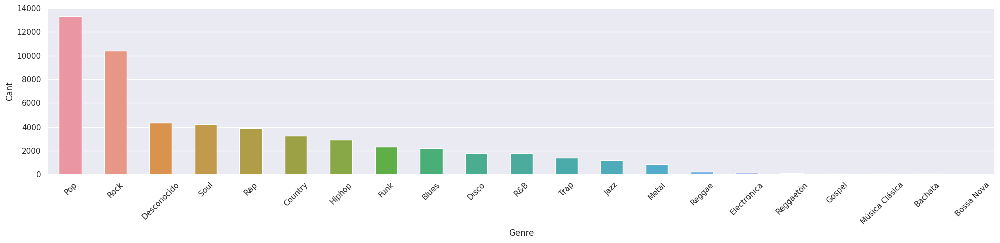

In [261]:
#Para graficar todos los géneros
m = np.arange(0,21)
Genre = pd.DataFrame(index = m, columns = ["Genre", "Cant"])
col = Género.columns
col = col.drop("Canción ID")
for j in range(col.shape[0]-1):
  Genre.iloc[j,0] = col[j]
  Genre.iloc[j,1] = Género[col[j]].value_counts().loc[True]
#Primero tengo que ordenar el DataFrame
Genre = Genre.sort_values(by = "Cant", ascending = False)
fig, ax = plt.subplots(figsize = (20,5))
sns.barplot(x = Genre["Genre"], y = Genre["Cant"], ax = ax, width = 0.5)
for item in ax.get_xticklabels():
    item.set_rotation(45)

In [262]:
D1año = Top100[(Top100["Fecha"].dt.year >= 2020) & (Top100["Fecha"].dt.year <= 2021)]
#El dataframe resultante cuenta apariciones en función de la canción y de la posición
D20 = pd.crosstab(D1año["Canción ID"], D1año["Ranking"])
#Se eliminan algunas posiciones porque no son relevantes
D20 = D20.drop(columns = [11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100])
D20 = D20.rename(columns = {1:"1",2:"2",3:"3",4:"4",5:"5",6:"6",7:"7",8:"8",9:"9",10:"10"})
#Después se suman todos los valores del 1 al 10
D20.insert(10, "Cantidad de semanas", D20.sum(axis = 1))
n = 15
C1D2head = D20.sort_values("Cantidad de semanas", ascending = False).head(n)
C1D2tail = D20.sort_values("Cantidad de semanas", ascending = False).tail(n)
#Después hay que agregar las columnas de las propiedades
#Este array es para identificar según el orden de la cantidad de semanas
arrayhead = np.arange(1,n+1)
#Acá se agregan las columnas HEAD
C1D2head.insert(1, "Posición", arrayhead)
C1D2head.insert(2, "Década", 1)
C1D2head.insert(3, "Duración", 0)
C1D2head.insert(4, "Bailabilidad", 0)
C1D2head.insert(5, "Energía", 0)
C1D2head.insert(6, "Clave", 0)
C1D2head.insert(7, "Sonoridad", 0)
C1D2head.insert(8, "Contenido vocal", 0)
C1D2head.insert(9, "Acusticidad", 0)
C1D2head.insert(10, "Valencia", 0)
C1D2head.insert(11, "Tempo", 0)
#Acá se agregan las columnas TAIL
arraytail = -np.arange(1,n+1)
C1D2tail.insert(1, "Posición", arraytail)
C1D2tail.insert(2, "Década", 1)
C1D2tail.insert(3, "Duración", 0)
C1D2tail.insert(4, "Bailabilidad", 0)
C1D2tail.insert(5, "Energía", 0)
C1D2tail.insert(6, "Clave", 0)
C1D2tail.insert(7, "Sonoridad", 0)
C1D2tail.insert(8, "Contenido vocal", 0)
C1D2tail.insert(8, "Acusticidad", 0)
C1D2tail.insert(10, "Valencia", 0)
C1D2tail.insert(11, "Tempo", 0)
#Agrega los atributos
for i in range(0,scaled_df.shape[0]):
  m = C1D2head.index
  for j in range (0,C1D2head.shape[0]):
    if Canción.iloc[i,0] == m[j]:
      C1D2head.iloc[j,3] = scaled_df.iloc[i,1] #Duración
      C1D2head.iloc[j,4] = scaled_df.iloc[i,2] #
      C1D2head.iloc[j,5] = scaled_df.iloc[i,3]
      C1D2head.iloc[j,6] = scaled_df.iloc[i,4]
      C1D2head.iloc[j,7] = scaled_df.iloc[i,5]
      C1D2head.iloc[j,8] = scaled_df.iloc[i,6]
      C1D2head.iloc[j,9] = scaled_df.iloc[i,7]
      C1D2head.iloc[j,10] = scaled_df.iloc[i,8]
      C1D2head.iloc[j,11] = scaled_df.iloc[i,9] #Tempo
#TAIL
for i in range(0,scaled_df.shape[0]):
  m = C1D2tail.index
  for j in range (0,C1D2tail.shape[0]):
    if Canción.iloc[i,0] == m[j]:
      C1D2tail.iloc[j,3] = scaled_df.iloc[i,1] #Duración
      C1D2tail.iloc[j,4] = scaled_df.iloc[i,2] #Bailabilidad
      C1D2tail.iloc[j,5] = scaled_df.iloc[i,3] #Energía
      C1D2tail.iloc[j,6] = scaled_df.iloc[i,4] #Clave
      C1D2tail.iloc[j,7] = scaled_df.iloc[i,5] #Sonoridad
      C1D2tail.iloc[j,8] = scaled_df.iloc[i,6] #Contenido vocal
      C1D2tail.iloc[j,9] = scaled_df.iloc[i,7] #Acusticidad
      C1D2tail.iloc[j,10] = scaled_df.iloc[i,8] #Valencia
      C1D2tail.iloc[j,11] = scaled_df.iloc[i,9] #Tempo
C1D2head.insert(12, "Ranking", "x")
C1D2tail.insert(12, "Ranking", "x")
C1D2 = pd.concat([C1D2head, C1D2tail], axis = 0)
for i in range(0,C1D2.shape[0]): 
  if C1D2.iloc[i,1] <= 0:
    C1D2.iloc[i,12] = "Últimos"
  else:
    C1D2.iloc[i,12] = "Primeros"
#Ahora lo tengo que normalizar, solo pasandole los valores cuantitativos
C1D2 = C1D2.dropna(axis = 0)
C1D2 = C1D2.drop(columns = ["Cantidad de semanas", "Década", "Posición"])

In [263]:
C1D2.insert(10, "Género", 0)

In [264]:
#Relación con el género
for k in range(0,Género.shape[0]):
  for i in range(0,C1D2.shape[0]):
    if C1D2.index[i] == Género.iloc[k,0]:
      C1D2.iloc[i,10] = Género.iloc[k,22]

In [265]:
D20 = pd.crosstab(Top100["Canción ID"], Top100["Ranking"])
D20 = D20.drop(columns = [11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100])
D20 = D20.loc[(D20!=0).any(1)]

In [266]:
Género.index = Género["Canción ID"]
Género = Género.drop(columns = ["Canción ID"])

In [267]:
D20 = D20.join(Género, lsuffix = "G")

In [268]:
D20

,1,2,3,4,5,6,7,8,9,10,...,Disco,Reggae,Reggaetón,Gospel,Metal,R&B,Bachata,Bossa Nova,Desconocido,Género
Canción ID,,,,,,,,,,,,,,,,,,,,,
#9 DreamJohn Lennon,0,0,0,0,0,0,0,0,1,1,...,False,False,False,False,False,False,False,False,False,Rock
'03 Bonnie & ClydeJay-Z Featuring Beyonce Knowles,0,0,0,3,3,2,0,2,0,1,...,False,False,False,False,False,False,False,False,False,Rap
'65 Love AffairPaul Davis,0,0,0,0,0,2,1,1,3,0,...,False,False,False,False,False,False,False,False,False,Country
('til) I Kissed YouThe Everly Brothers,0,0,0,3,3,1,0,0,0,0,...,False,False,False,False,False,False,False,False,False,Rock
(Can't Live Without Your) Love And AffectionNelson,1,0,1,1,0,2,0,1,0,1,...,False,False,False,False,False,False,False,False,False,Country
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
everything i wantedBillie Eilish,0,0,0,0,0,0,0,1,0,0,...,False,False,False,False,False,False,False,False,False,Pop
iSpyKYLE Featuring Lil Yachty,0,0,0,1,1,2,0,2,0,2,...,False,False,False,False,False,False,False,False,False,Rap
interludeJ. Cole,0,0,0,0,0,0,0,1,0,0,...,False,False,False,False,False,False,False,False,False,Rap


In [269]:
D20 = D20.drop(columns = ["Pop", "Rock", "Música Clásica", "Disco", "Electrónica", "Funk", "Soul","Metal","R&B", "Bachata","Bossa Nova", "Desconocido", "Reggae", "Reggaetón", "Gospel", "Hiphop", "Rap", "Trap", "Blues", "Jazz", "Country"])

In [270]:
D = pd.pivot_table(D20, index=["Género"], aggfunc=np.sum)

In [271]:
D = D.drop(labels = 0, axis = 0)

In [272]:
D = D.sort_values(by = 1, ascending = False)

<Axes: ylabel='Género'>

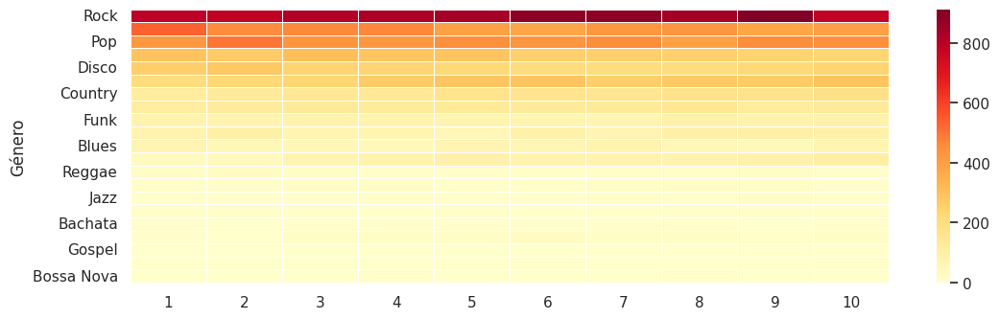

In [273]:
sns.heatmap(D, fmt="d", linewidths=0.4, cmap="YlOrRd")

In [274]:
D20.insert(3, "Duración", 0)
D20.insert(4, "Bailabilidad", 0)
D20.insert(5, "Energía", 0)
D20.insert(6, "Clave", 0)
D20.insert(7, "Sonoridad", 0)
D20.insert(8, "Contenido vocal", 0)
D20.insert(9, "Acusticidad", 0)
D20.insert(10, "Valencia", 0)
D20.insert(11, "Tempo", 0)

In [275]:
#Agrega los atributos
for i in range(0,scaled_df.shape[0]):
  m = D20.index
  for j in range (0,D20.shape[0]):
    if Canción.iloc[i,0] == m[j]:
      D20.iloc[j,3] = scaled_df.iloc[i,1] #Duración
      D20.iloc[j,4] = scaled_df.iloc[i,2] #
      D20.iloc[j,5] = scaled_df.iloc[i,3]
      D20.iloc[j,6] = scaled_df.iloc[i,4]
      D20.iloc[j,7] = scaled_df.iloc[i,5]
      D20.iloc[j,8] = scaled_df.iloc[i,6]
      D20.iloc[j,9] = scaled_df.iloc[i,7]
      D20.iloc[j,10] = scaled_df.iloc[i,8]
      D20.iloc[j,11] = scaled_df.iloc[i,9] #Tempo

In [276]:
D20 = D20.drop(columns = [1,2])

In [277]:
D20 = D20.drop(columns = [3,4,5,6,7,8,9,10])

In [293]:
DG = D20.loc[(D20["Género"] == "Rock") | (D20["Género"] == "Pop") | (D20["Género"] == "R&B")]

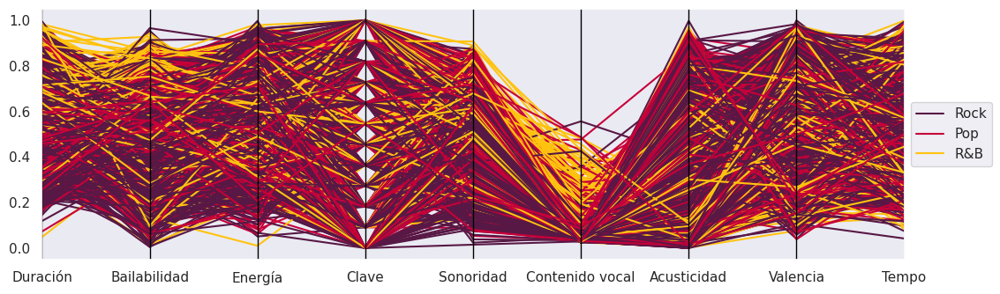

In [294]:
#Relación entre el género musical y las características de las canciones
from pandas.plotting import parallel_coordinates
plt.rcParams["figure.figsize"] = [11.50, 3.50]
plt.rcParams["figure.autolayout"] = True
fig, ax = plt.subplots()
D20 = D20.dropna()
parallel_coordinates(DG, "Género", color=('#581845','#c70039', "#ffc30f"), ax = ax)
ax.grid(False)
#Put a legend to the right of the current axis
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

In [289]:
D20

,Duración,Bailabilidad,Energía,Clave,Sonoridad,Contenido vocal,Acusticidad,Valencia,Tempo,Género
Canción ID,,,,,,,,,,
#9 DreamJohn Lennon,0.728476,0.274314,0.588647,0.000000,0.371474,0.035331,0.075073,0.482341,0.467632,Rock
'65 Love AffairPaul Davis,0.512040,0.574813,0.680173,0.181818,0.766834,0.028812,0.435922,0.960646,0.746152,Country
('til) I Kissed YouThe Everly Brothers,0.273808,0.413965,0.418963,0.909091,0.374427,0.048265,0.404640,0.707366,0.634461,Rock
(Can't Live Without Your) Love And AffectionNelson,0.565735,0.445137,0.902304,0.090909,0.656262,0.041325,0.035719,0.862765,0.508797,Country
(Everything I Do) I Do It For YouBryan Adams,0.515180,0.415212,0.357260,0.090909,0.324545,0.029863,0.082339,0.300706,0.576712,Rock
...,...,...,...,...,...,...,...,...,...,...
YummyJustin Bieber,0.481716,0.624688,0.503291,0.818182,0.642130,0.094322,0.369322,0.498486,0.678459,Pop
ZEZEKodak Black Featuring Travis Scott & Offset,0.540939,0.841646,0.594817,0.727273,0.685579,0.185068,0.052571,0.508577,0.346933,Trap
everything i wantedBillie Eilish,0.594776,0.645885,0.206088,0.545455,0.228632,0.104522,0.910191,0.245207,0.499013,Pop
